# 3 EDA

INTRO. Intro visual del dataset → mostrar su composición y magnitud.

3.1 Affordances subida. Caracterizan el contenido y al canal.

3.1.1 Category_id

3.1.2. Cluster_umap5

3.1.3 Duration_minutes

3.1.4 Frecuencia_videos

3.1.5 Restantes. Categorías con categorías

3.2 Affordances interactivas. Expresan la reacción de la audiencia 

3.2.1 Views

3.2.2. Likes

3.2.3. Engagement Rate

3.2.4. Mostpopular

3.2.5. Suscriptores y Views canal

3.3 Relaciones cruzadas y conclusiones

In [1]:
import pandas as pd
import numpy  as np
import seaborn as sns        
import matplotlib.pyplot as plt 
import statsmodels.api as sm
from sklearn.preprocessing import RobustScaler
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import glob
import os
import time    
import re
import plotly.express as px
from umap.umap_ import UMAP           # <- importante: umap-learn
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import hdbscan
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
import plotly.express as px
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import nltk
from wordcloud import WordCloud
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from statsmodels.formula.api import ols

/opt/anaconda3/envs/yt-ml-spvd/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df_1=pd.read_parquet(
    "/Users/danielmunoz/Documents/EDUCACION/DATA_ANALIST/CURSOS/TFM/DATA/PROCESSED/df_TFMYouTube_embeddings_UMAP5_CLUSTERS_UMAP2.parquet")

## 3.1. Affordances subida

3.1.1. Category_id

Intro

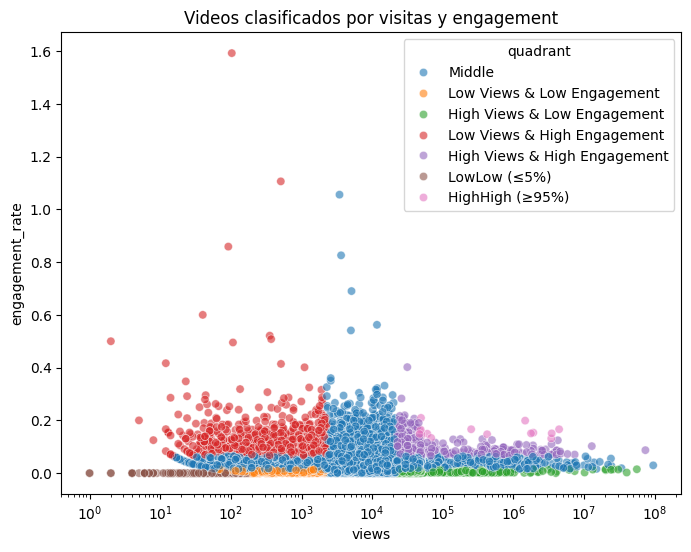

In [3]:
# ==========================
# 1. Calcular percentiles
# ==========================
views_p25, views_p75 = df_1["views"].quantile([0.25, 0.75])
eng_p25, eng_p75     = df_1["engagement_rate"].quantile([0.25, 0.75])

views_p5, views_p95  = df_1["views"].quantile([0.05, 0.95])
eng_p5, eng_p95      = df_1["engagement_rate"].quantile([0.05, 0.95])

# ==========================
# 2. Función de clasificación
# ==========================
def categorize(row):
    v, e = row["views"], row["engagement_rate"]

    # Extremos 5%
    if v <= views_p5 and e <= eng_p5:
        return "LowLow (≤5%)"
    if v >= views_p95 and e >= eng_p95:
        return "HighHigh (≥95%)"

    # Cuadrantes amplios (25/75)
    if v >= views_p75 and e >= eng_p75:
        return "High Views & High Engagement"
    elif v >= views_p75 and e <= eng_p25:
        return "High Views & Low Engagement"
    elif v <= views_p25 and e >= eng_p75:
        return "Low Views & High Engagement"
    elif v <= views_p25 and e <= eng_p25:
        return "Low Views & Low Engagement"

    # En el medio
    return "Middle"

# ==========================
# 3. Aplicar al DataFrame
# ==========================
df_1["quadrant"] = df_1.apply(categorize, axis=1)


plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df_1, x="views", y="engagement_rate",
    hue="quadrant", alpha=0.6
)
plt.xscale("log")
plt.title("Videos clasificados por visitas y engagement")
plt.show()

Gini de views: 0.915
Proporción de vídeos necesaria para acumular el 80% de views: 100.0%


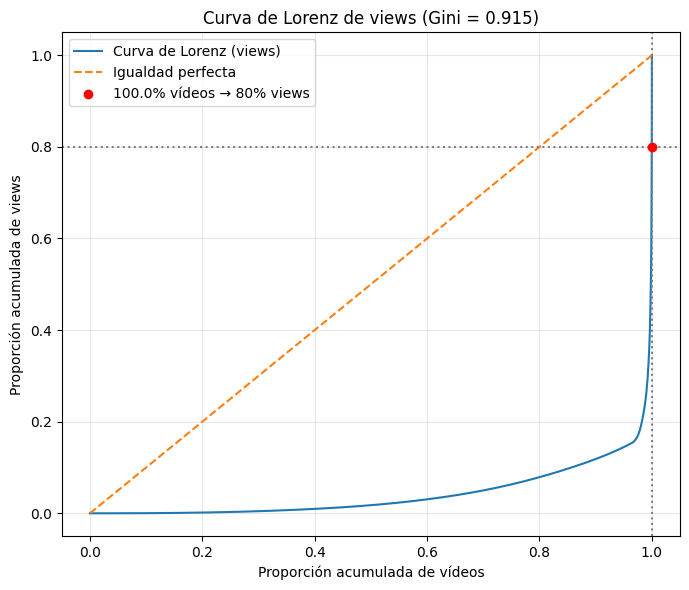

In [4]:

# --- 0) Preparación: columna de views limpia ---
views = pd.to_numeric(df_1["views"], errors="coerce").fillna(0).values
n = len(views)
if n == 0:
    raise ValueError("No hay datos de 'views'.")

# --- 1) Ordenar de menor a mayor y calcular acumulados ---
views_sorted = np.sort(views)                    # ascendente
cum_views = np.cumsum(views_sorted)              # acumulado de views
total_views = cum_views[-1] if cum_views[-1] > 0 else 1.0

# Eje X: proporción acumulada de vídeos (0..1)
cum_videos = np.arange(1, n+1) / n
# Eje Y: proporción acumulada de views (0..1)
lorenz = cum_views / total_views
lorenz = np.insert(lorenz, 0, 0)                 # forzar origen (0,0)
cum_videos0 = np.insert(cum_videos, 0, 0)

# --- 2) Gini (área entre igualdad y Lorenz): G = 1 - 2 * AUC(Lorenz) ---
auc_lorenz = np.trapz(lorenz, cum_videos0)
gini = 1 - 2 * auc_lorenz

# --- 3) ¿Qué % de vídeos concentra el 80% de las views? ---
threshold = 0.80
# índice del primer punto donde el acumulado de views >= 80%
idx_80 = np.searchsorted(lorenz, threshold)
prop_videos_80 = cum_videos0[idx_80] * 100   # en porcentaje

print(f"Gini de views: {gini:.3f}")
print(f"Proporción de vídeos necesaria para acumular el 80% de views: {prop_videos_80:.1f}%")

# --- 4) Gráfica de Lorenz ---
plt.figure(figsize=(7,6))
plt.plot(cum_videos0, lorenz, label="Curva de Lorenz (views)")
plt.plot([0,1], [0,1], linestyle="--", label="Igualdad perfecta")
# marcar el punto del 80%
plt.axhline(threshold, color="gray", linestyle=":")
plt.axvline(cum_videos0[idx_80], color="gray", linestyle=":")
plt.scatter([cum_videos0[idx_80]], [threshold], color="red", zorder=3,
            label=f"{prop_videos_80:.1f}% vídeos → 80% views")

plt.xlabel("Proporción acumulada de vídeos")
plt.ylabel("Proporción acumulada de views")
plt.title(f"Curva de Lorenz de views (Gini = {gini:.3f})")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

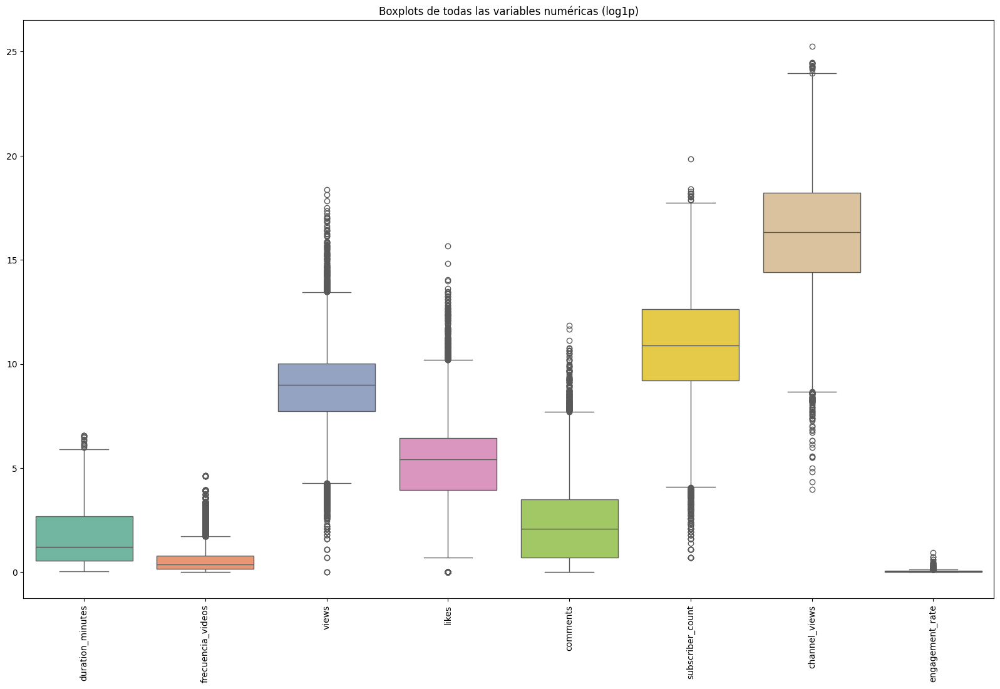

In [5]:
num_cols = [
    'duration_minutes', 'frecuencia_videos','views', 'likes', 'comments', 
    'subscriber_count', "channel_views",
    'engagement_rate' 
]
df_num = df_1[num_cols]

plt.figure(figsize=(20,12))  # Crear figura grande primero
sns.boxplot(data=np.log1p(df_num), orient='v', palette='Set2')  # Boxplot con log
plt.xticks(rotation=90)  # Rotar nombres de columnas
plt.title("Boxplots de todas las variables numéricas (log1p)")
plt.show()

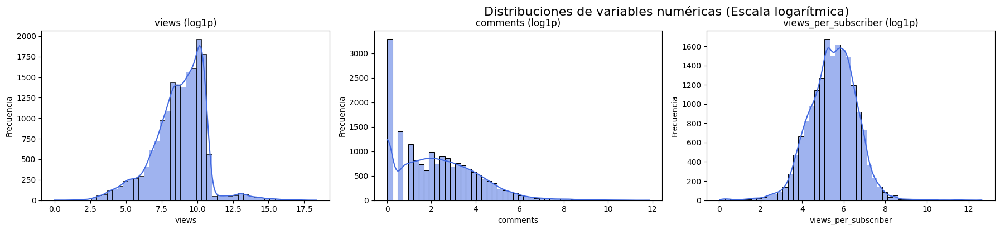

In [6]:
df_1["views_per_subscriber"] = df_1["channel_views"] / df_1["subscriber_count"].replace(0, np.nan)

num_cols = [
   'views', 'comments', "views_per_subscriber"
    
]
n_cols = 4
n_rows = int(np.ceil(len(num_cols) / n_cols))
plt.figure(figsize=(n_cols*6, n_rows*4))
df_log = df_1.copy()
for c in num_cols:
    df_log[c] = np.log1p(df_log[c])  # aplicar log1p a cada variable

for i, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i+1)
    sns.histplot(df_log[col].dropna(), bins=50, kde=True, color="royalblue")
    plt.title(f"{col} (log1p)")
    plt.xlabel(col)
    plt.ylabel("Frecuencia")
    plt.tight_layout()
plt.suptitle("Distribuciones de variables numéricas (Escala logarítmica)", fontsize=16, y=1.02)
plt.show()

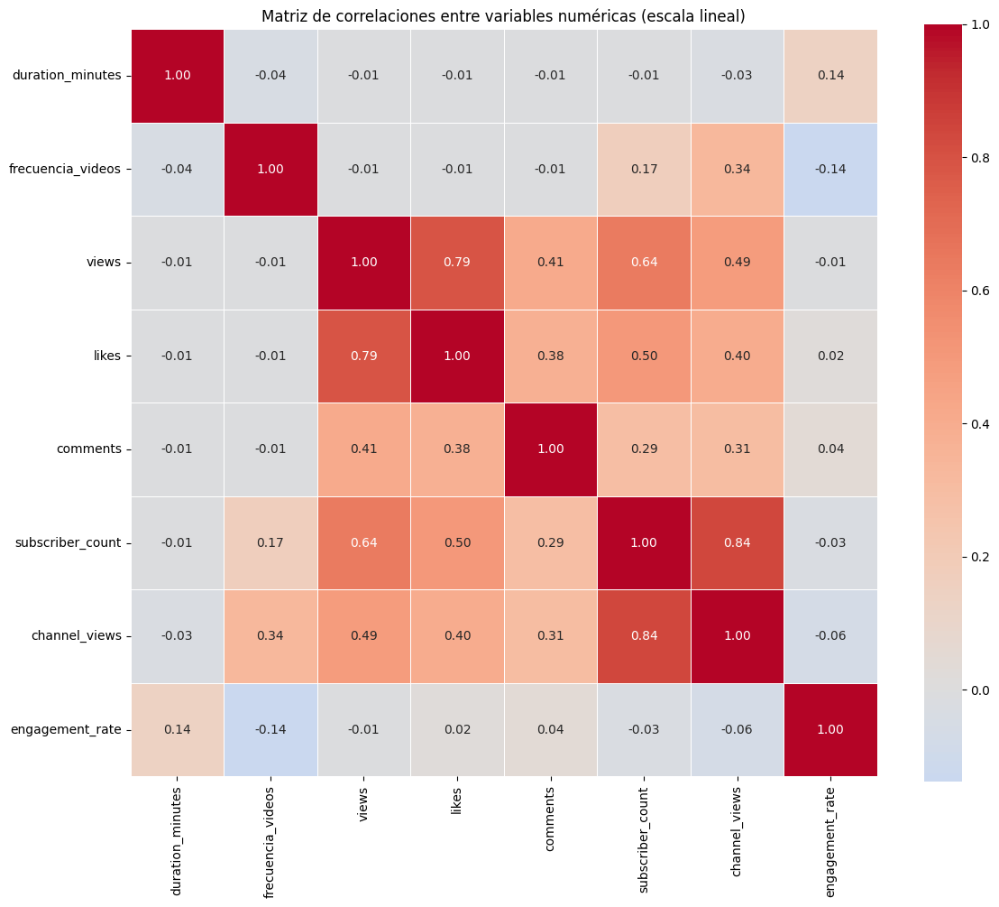

In [7]:
num_cols = [
    'duration_minutes', 'frecuencia_videos','views', 'likes', 'comments', 
    'subscriber_count', "channel_views",
    'engagement_rate' 
]
# === 4) Heatmap escala normal ===
corr_matrix = df_1[num_cols].corr()

# === 3) Graficar heatmap ===
plt.figure(figsize=(12, 10))
sns.heatmap(
    corr_matrix,
    cmap="coolwarm",
    center=0,
    annot=True,       # muestra los valores numéricos
    fmt=".2f",        # formato decimal
    square=True,
    linewidths=0.5
)
plt.title("Matriz de correlaciones entre variables numéricas (escala lineal)")
plt.tight_layout()
plt.show()
# === 6) Correlaciones ordenadas respecto a 'views' (para análisis de importancia) ===


In [8]:
# Diccionario oficial de categorías de YouTube (global)
category_map = {
    1: "Film & Animation",
    2: "Autos & Vehicles",
    10: "Music",
    15: "Pets & Animals",
    17: "Sports",
    18: "Short Movies",
    19: "Travel & Events",
    20: "Gaming",
    21: "Videoblogging",
    22: "People & Blogs",
    23: "Comedy",
    24: "Entertainment",
    25: "News & Politics",
    26: "Howto & Style",
    27: "Education",
    28: "Science & Technology",
    29: "Nonprofits & Activism",
    30: "Movies",
    31: "Anime/Animation",
    32: "Action/Adventure",
    33: "Classics",
    34: "Comedy",
    35: "Documentary",
    36: "Drama",
    37: "Family",
    38: "Foreign",
    39: "Horror",
    40: "Sci-Fi/Fantasy",
    41: "Thriller",
    42: "Shorts",
    43: "Shows",
    44: "Trailers"
}
df_1["category_name"] = df_1["category_id"].map(category_map)

/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/997654748.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_1, x="category_name", palette="viridis", order=order, edgecolor="black")


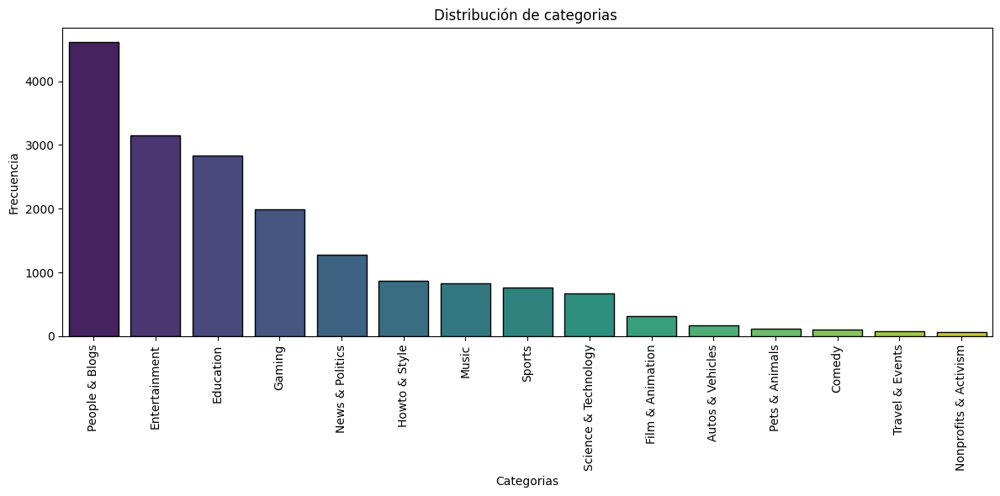

In [9]:
order = df_1["category_name"].value_counts().index
plt.figure(figsize=(12,6))
sns.countplot(data=df_1, x="category_name", palette="viridis", order=order, edgecolor="black")
plt.title(f"Distribución de categorias ")
plt.xlabel("Categorias")
plt.xticks(rotation=90)
plt.ylabel("Frecuencia")
plt.tight_layout()
plt.show()

Qué tipo de géneros generan más comentarios por cada 1000 vistas? Y likes? Cuál es la categoría que mas engagement genera de media?


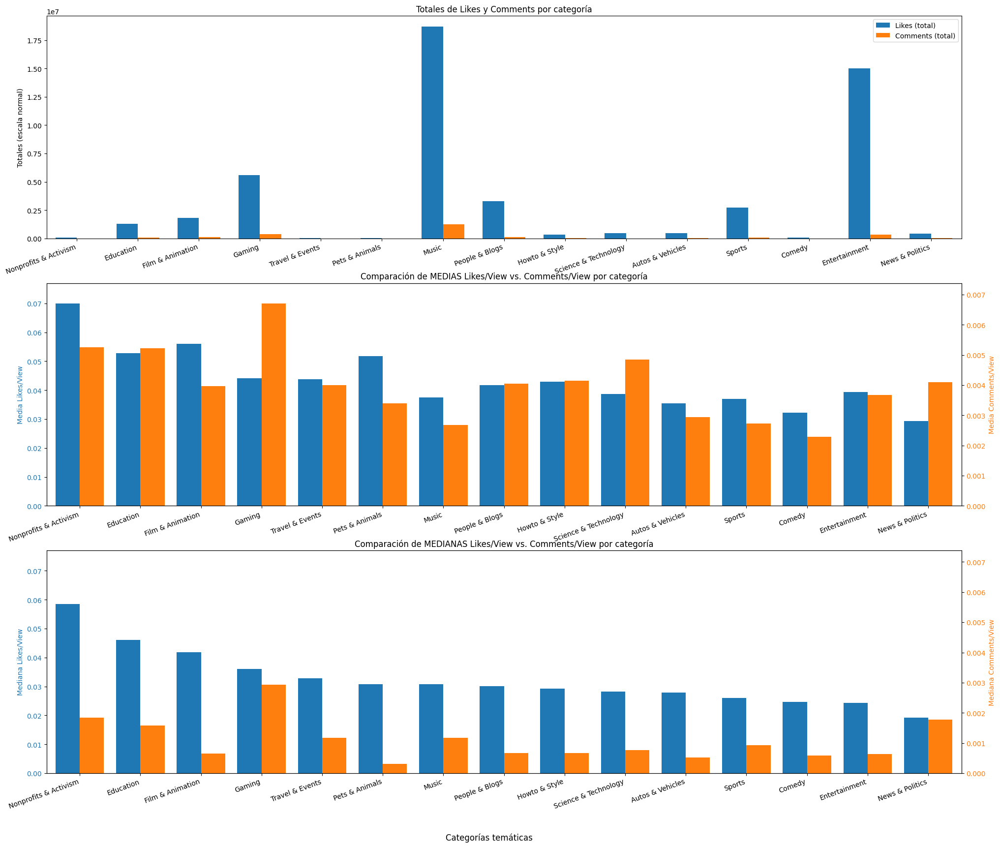

In [10]:
# --- Cálculo de estadísticas ---
ranking_medianas = (
    df_1.groupby("category_name")[["likes_per_view", "comments_per_view"]]
        .median()
        .reset_index()
)

ranking_medias = (
    df_1.groupby("category_name")[["likes_per_view", "comments_per_view"]]
        .mean()
        .reset_index()
)

ranking_totales = (
    df_1.groupby("category_name")[["likes", "comments"]]
        .sum()
        .reset_index()
)

# --- Orden por mediana de likes_per_view ---
order = ranking_medianas.sort_values("likes_per_view", ascending=False)["category_name"]

ranking_medianas = ranking_medianas.set_index("category_name").loc[order].reset_index()
ranking_medias   = ranking_medias.set_index("category_name").loc[order].reset_index()
ranking_totales  = ranking_totales.set_index("category_name").loc[order].reset_index()

# --- Escalas máximas (para medias y medianas) ---
ymax_likes    = max(ranking_medias["likes_per_view"].max(), ranking_medianas["likes_per_view"].max())
ymax_comments = max(ranking_medias["comments_per_view"].max(), ranking_medianas["comments_per_view"].max())

x = np.arange(len(order))

# NOTA: no usamos sharex para que todos muestren etiquetas
fig, axes = plt.subplots(3, 1, figsize=(24, 20))

# ========= 1) Totales =========
ax1 = axes[0]
w = 0.35
ax1.bar(x - w/2, ranking_totales["likes"],    width=w, color="tab:blue",   label="Likes (total)")
ax1.bar(x + w/2, ranking_totales["comments"], width=w, color="tab:orange", label="Comments (total)")
ax1.set_title("Totales de Likes y Comments por categoría")
ax1.set_ylabel("Totales (escala normal)")
ax1.legend(loc="upper right")

# Forzar ticks/labels en X
ax1.set_xticks(x)
ax1.set_xticklabels(order, rotation=20, ha="right")
ax1.tick_params(axis="x", which="both", labelbottom=True)
ax1.margins(x=0.01)

# ========= 2) Medias =========
ax2 = axes[1]
ax2.bar(x - 0.2, ranking_medias["likes_per_view"],    width=0.4, color="tab:blue",   label="Likes/View (media)")
ax2.set_ylabel("Media Likes/View", color="tab:blue")
ax2.tick_params(axis="y", labelcolor="tab:blue")
ax2.set_ylim(0, ymax_likes*1.1)

ax3 = ax2.twinx()
ax3.bar(x + 0.2, ranking_medias["comments_per_view"], width=0.4, color="tab:orange", label="Comments/View (media)")
ax3.set_ylabel("Media Comments/View", color="tab:orange")
ax3.tick_params(axis="y", labelcolor="tab:orange")
ax3.set_ylim(0, ymax_comments*1.1)

ax2.set_title("Comparación de MEDIAS Likes/View vs. Comments/View por categoría")

# Forzar ticks/labels en X (aunque haya twinx)
ax2.set_xticks(x)
ax2.set_xticklabels(order, rotation=20, ha="right")
ax2.tick_params(axis="x", which="both", labelbottom=True)
ax2.margins(x=0.01)

# ========= 3) Medianas =========
ax4 = axes[2]
ax4.bar(x - 0.2, ranking_medianas["likes_per_view"],    width=0.4, color="tab:blue",   label="Likes/View (mediana)")
ax4.set_ylabel("Mediana Likes/View", color="tab:blue")
ax4.tick_params(axis="y", labelcolor="tab:blue")
ax4.set_ylim(0, ymax_likes*1.1)

ax5 = ax4.twinx()
ax5.bar(x + 0.2, ranking_medianas["comments_per_view"], width=0.4, color="tab:orange", label="Comments/View (mediana)")
ax5.set_ylabel("Mediana Comments/View", color="tab:orange")
ax5.tick_params(axis="y", labelcolor="tab:orange")
ax5.set_ylim(0, ymax_comments*1.1)

ax4.set_title("Comparación de MEDIANAS Likes/View vs. Comments/View por categoría")

# Forzar ticks/labels en X (con twinx)
ax4.set_xticks(x)
ax4.set_xticklabels(order, rotation=20, ha="right")
ax4.tick_params(axis="x", which="both", labelbottom=True)
ax4.margins(x=0.01)

# Etiqueta común del eje X
fig.supxlabel("Categorías temáticas", y=0.04, fontsize=12)

# Más espacio inferior para etiquetas largas
plt.show()

ENGAGEMENT CON VARIABLES INTERACTIVAS

<Figure size 1000x600 with 0 Axes>

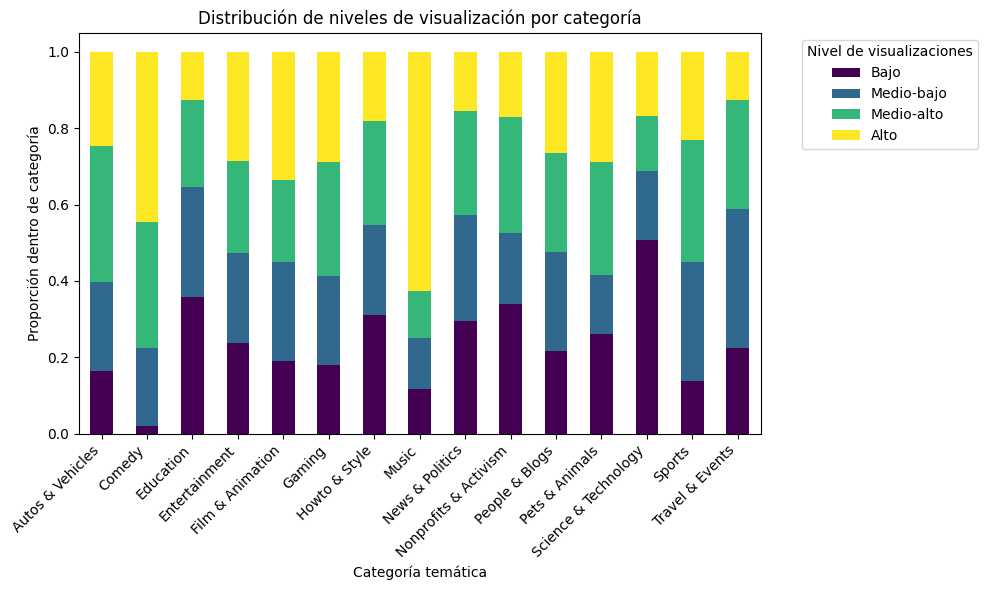

In [11]:
df_1["views_bin"] = pd.qcut(df_1["views"], q=4, labels=["Bajo", "Medio-bajo", "Medio-alto", "Alto"])

# Relacionar categoría con tramos de views
col = "category_name"
target_col = "views_bin"

plt.figure(figsize=(10,6))
prop = pd.crosstab(df_1[col], df_1[target_col], normalize="index")

ax = prop.plot(kind="bar", stacked=True, figsize=(10,6), colormap="viridis")
plt.title("Distribución de niveles de visualización por categoría")
plt.xlabel("Categoría temática")
plt.ylabel("Proporción dentro de categoría")
plt.legend(title="Nivel de visualizaciones", bbox_to_anchor=(1.05,1), loc="upper left")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

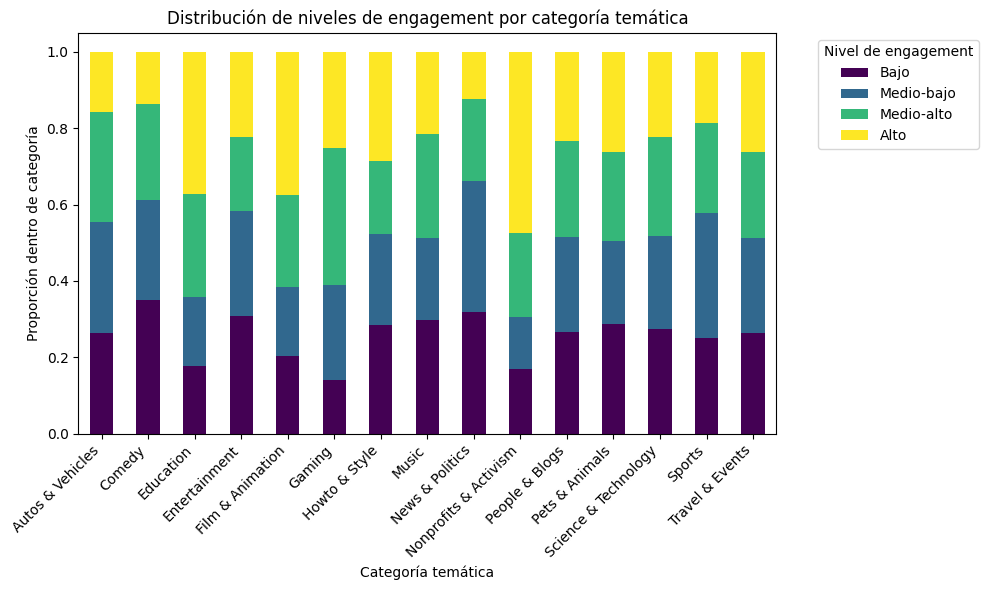

In [12]:
df_1["engagement_bin"] = pd.qcut(
    df_1["engagement_rate"], 
    q=4, 
    labels=["Bajo", "Medio-bajo", "Medio-alto", "Alto"]
)

# Relacionar categoría con tramos de engagement
col = "category_name"
target_col = "engagement_bin"

plt.figure(figsize=(10,6))
prop = pd.crosstab(df_1[col], df_1[target_col], normalize="index")

ax = prop.plot(
    kind="bar", stacked=True, figsize=(10,6), colormap="viridis"
)
plt.title("Distribución de niveles de engagement por categoría temática")
plt.xlabel("Categoría temática")
plt.ylabel("Proporción dentro de categoría")
plt.legend(title="Nivel de engagement", bbox_to_anchor=(1.05,1), loc="upper left")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

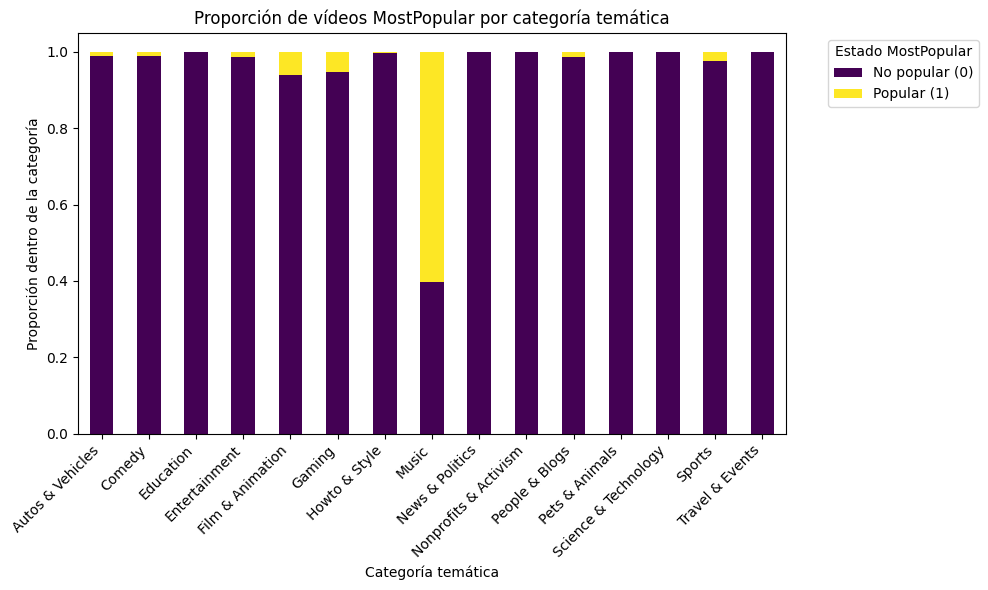

In [13]:
df_1["mostpopular"] = df_1["mostpopular"].astype(int)

# Variables
col = "category_name"
target_col = "mostpopular"

# Tabla de proporciones
prop = pd.crosstab(df_1[col], df_1[target_col], normalize="index")

# Renombra las columnas para claridad
prop.columns = ["No popular (0)", "Popular (1)"]

# Gráfico
plt.figure(figsize=(10,6))
ax = prop.plot(
    kind="bar", stacked=True, figsize=(10,6), colormap="viridis"
)
plt.title("Proporción de vídeos MostPopular por categoría temática")
plt.xlabel("Categoría temática")
plt.ylabel("Proporción dentro de la categoría")
plt.legend(title="Estado MostPopular", bbox_to_anchor=(1.05,1), loc="upper left")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

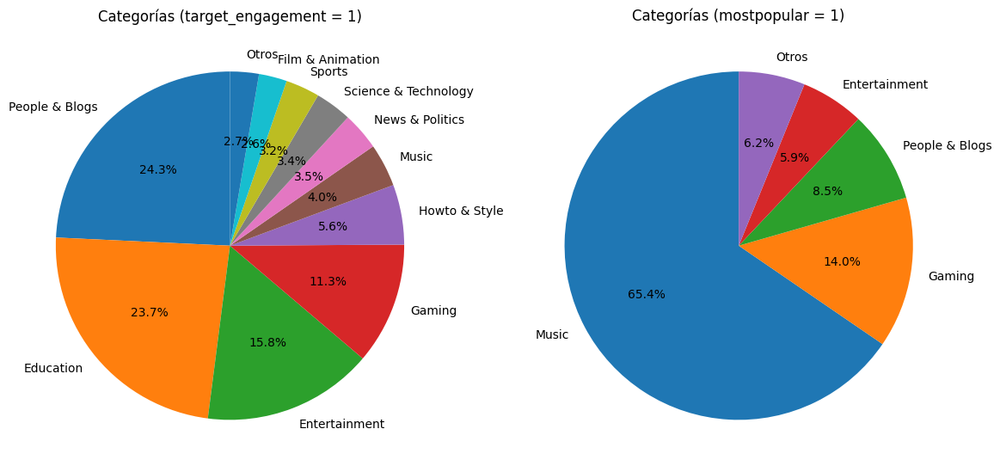

In [14]:
p75 = df_1["engagement_rate"].quantile(0.75)

# Crear una nueva columna: 1 si está en el 25% superior, 0 si no
df_1["target_engagement"] = (df_1["engagement_rate"] >= p75).astype(int)

# Filtrar los dos subconjuntos
df_eng = df_1[df_1["target_engagement"] == 1]
df_pop = df_1[df_1["mostpopular"] == 1]

# Contar categorías
cat_eng = df_eng["category_name"].value_counts()
cat_pop = df_pop["category_name"].value_counts()

# Agrupar las menos frecuentes en "Otros" (usando pd.concat)
cat_eng = pd.concat([
    cat_eng.head(10),
    pd.Series({"Otros": cat_eng.iloc[10:].sum()})
])

cat_pop = pd.concat([
    cat_pop.head(4),
    pd.Series({"Otros": cat_pop.iloc[4:].sum()})
])

# Crear la figura con dos gráficos
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Gráfico 1: target_engagement
axes[0].pie(cat_eng, labels=cat_eng.index, autopct="%1.1f%%", startangle=90)
axes[0].set_title("Categorías (target_engagement = 1)")

# Gráfico 2: mostpopular
axes[1].pie(cat_pop, labels=cat_pop.index, autopct="%1.1f%%", startangle=90)
axes[1].set_title("Categorías (mostpopular = 1)")

plt.tight_layout()
plt.show()

In [15]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
model = ols("np.log1p(views) ~ C(category_name)", data=df_1).fit()
anova = sm.stats.anova_lm(model, typ=2)
print(anova)

                        sum_sq       df           F  PR(>F)
C(category_name)   6336.402484     14.0  144.978072     0.0
Residual          55600.195567  17810.0         NaN     NaN


P < 0.001, lo que implica que existe una diferencia estadísticamente significativa en las medias de views entre las distintas categorías de contenido.
El análisis de varianza (ANOVA) mostró diferencias estadísticamente significativas en las visualizaciones medias entre las distintas categorías de contenido (F(14, 17810) = 144.98, p < 0.001).
Esto sugiere que el tipo de temática influye en la visibilidad de los vídeos en YouTube, con ciertas categorías concentrando niveles de audiencia sistemáticamente más altos.

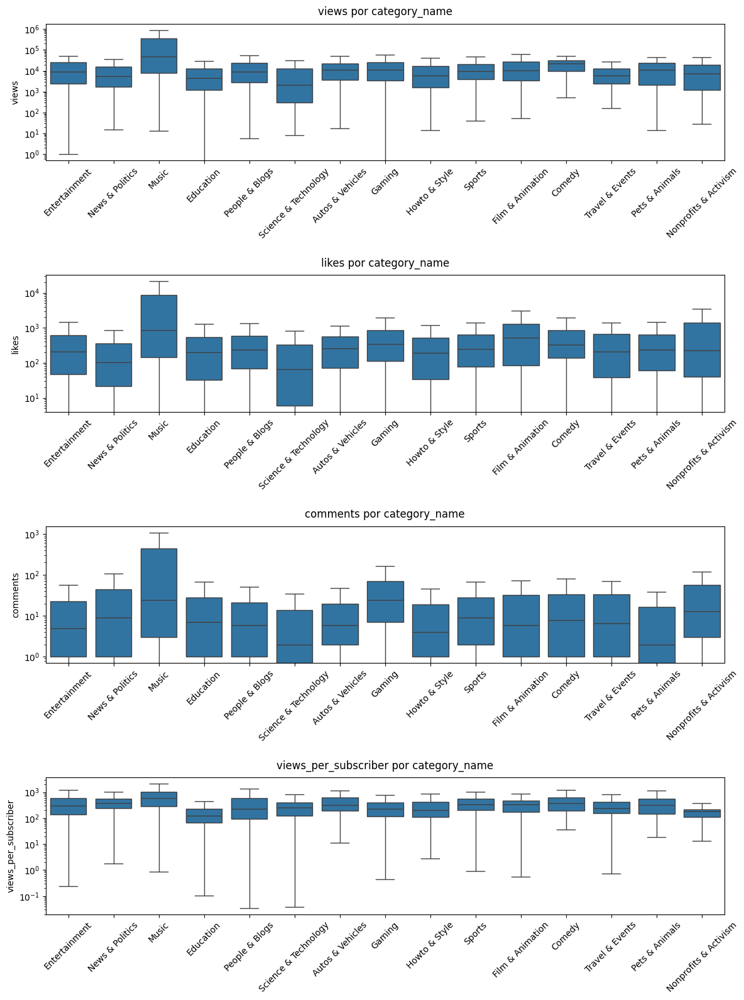

In [16]:
num_vars = ["views", "likes", "comments", "views_per_subscriber"]
group_var = "category_name"

fig, axes = plt.subplots(nrows=len(num_vars), ncols=1, figsize=(12, 4 * len(num_vars)))

for i, v in enumerate(num_vars):
    ax = axes[i]
    sns.boxplot(data=df_1, x=group_var, y=v, ax=ax, showfliers=False)
    ax.set_yscale("log")
    ax.set_title(f"{v} por {group_var}", fontsize=12, pad=10)
    ax.set_xlabel("")
    ax.set_ylabel(v)
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout(h_pad=2)
plt.show()

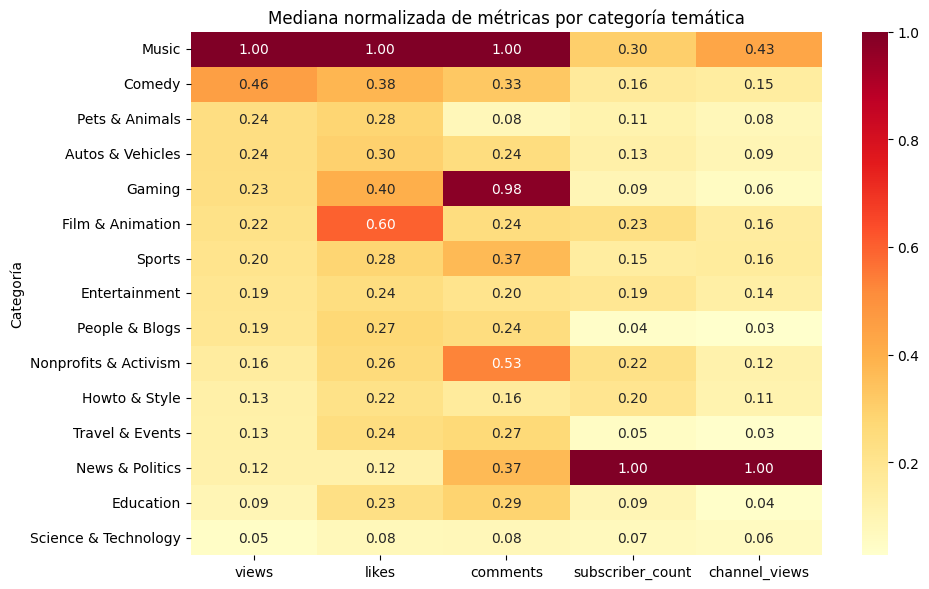

In [17]:

agg = (
    df_1.groupby("category_name")[["views", "likes", "comments", "subscriber_count","channel_views"]]
      .median()
      .sort_values("views", ascending=False)
)

agg_norm = agg.div(agg.max())  # normaliza entre 0 y 1 para comparar escalas

plt.figure(figsize=(10,6))
sns.heatmap(agg_norm, cmap="YlOrRd", annot=True, fmt=".2f")
plt.title("Mediana normalizada de métricas por categoría temática")
plt.ylabel("Categoría")
plt.tight_layout()
plt.show()

### 3.1.2 Embeddings

Procesamiento de embeddings

Con este código a continuación se disminuyeron las dimensiones de los embeddings obtenidos, en 5 y luego 2 dimiensiones, para poder situarlas en un espacio físico (eje x e y). Además, se empleó la técnica HDBSCAN para generar clusters a partir de los grupos establecidos.

Una vez realizado este proceso se guardó la información en un dataset, y de esta forma evitar la ejecución de este proceso de re-dimensionalización y clusterización cada vez que se tuviera que ejecutara este código

In [18]:
# Contar tamaño de clusters (sin ruido)
cluster_counts = (
    df_1.loc[df_1["cluster_umap5"] != -1, "cluster_umap5"]
      .value_counts()          # cuenta los vídeos por cluster
      .sort_values(ascending=False)  # ordena del más grande al más pequeño
)

print("Tamaño de clusters (sin ruido):")
print(cluster_counts.head(10))  # muestra los 10 más grandes

# Total de clusters (sin ruido)
total_clusters = len(cluster_counts)
print(f"\nTotal de clusters detectados (sin ruido): {total_clusters}")

# Calcular porcentaje de ruido
noise_pct = (df_1["cluster_umap5"] == -1).mean()
print(f"Porcentaje de ruido HDBSCAN: {noise_pct:.1%}")

Tamaño de clusters (sin ruido):
cluster_umap5
6     1410
23     750
26     721
31     719
5      650
3      642
15     442
14     435
21     341
18     321
Name: count, dtype: int64

Total de clusters detectados (sin ruido): 33
Porcentaje de ruido HDBSCAN: 46.3%


/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/3898715772.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap("tab20", max(1, len(valid_clusters)))


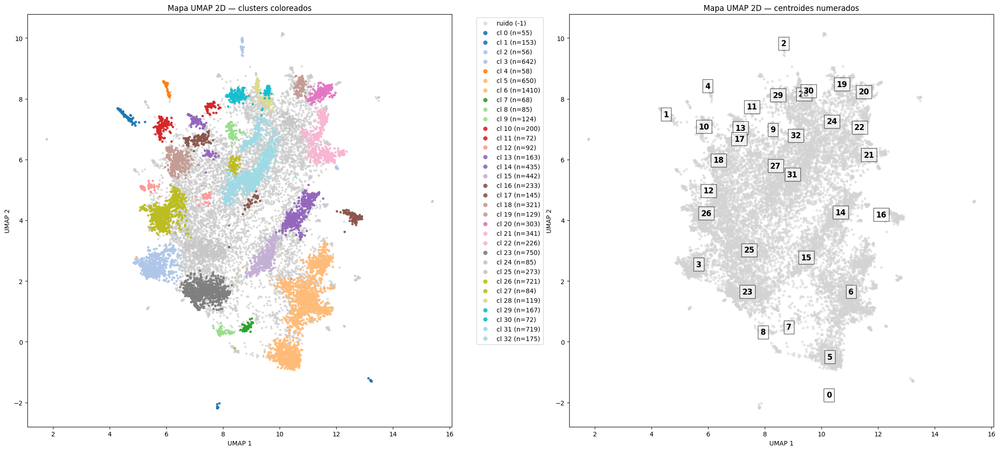

In [19]:
ig, axes = plt.subplots(1, 2, figsize=(22, 10))

# -------------------
# Mapa 1: clusters coloreados
# -------------------
ax = axes[0]
is_noise = df_1["cluster_umap5"] == -1
ax.scatter(df_1.loc[is_noise, "umap2_x"], df_1.loc[is_noise, "umap2_y"],
           s=6, c="#cccccc", alpha=0.6, label="ruido (-1)")

valid_clusters = sorted(c for c in df_1["cluster_umap5"].unique() if c != -1)
cmap = plt.cm.get_cmap("tab20", max(1, len(valid_clusters)))

for i, cl in enumerate(valid_clusters):
    m = df_1["cluster_umap5"] == cl
    ax.scatter(df_1.loc[m, "umap2_x"], df_1.loc[m, "umap2_y"],
               s=8, c=[cmap(i)], alpha=0.9, label=f"cl {cl} (n={m.sum()})")

ax.set_title("Mapa UMAP 2D — clusters coloreados")
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.legend(markerscale=2, bbox_to_anchor=(1.05, 1), loc="upper left")

# -------------------
# Mapa 2: clusters numerados (centroides)
# -------------------
ax2 = axes[1]
ax2.scatter(df_1["umap2_x"], df_1["umap2_y"], color="lightgrey", s=10, alpha=0.5)

# Calcular centroides
centroids = df_1.groupby("cluster_umap5")[["umap2_x", "umap2_y"]].mean().reset_index()

# Añadir números de cluster (omitimos ruido -1)
for _, row in centroids.iterrows():
    if row["cluster_umap5"] == -1:
        continue
    ax2.text(row["umap2_x"], row["umap2_y"], str(int(row["cluster_umap5"])),
             fontsize=12, fontweight="bold", ha="center", va="center",
             bbox=dict(facecolor="white", alpha=0.6, edgecolor="black"))

ax2.set_title("Mapa UMAP 2D — centroides numerados")
ax2.set_xlabel("UMAP 1")
ax2.set_ylabel("UMAP 2")

plt.tight_layout()
plt.show()

,cluster,term,lift,tfidf_cluster_mean,docs_in_cluster
0,0,nihan,0.168349,0.169322,55
1,0,amor eterno,0.151433,0.152312,55
2,0,eterno,0.137174,0.138260,55
3,0,kemal,0.134906,0.135686,55
4,0,triste,0.113695,0.114590,55
...,...,...,...,...,...
391,32,draw,0.059911,0.061853,175
392,32,how draw,0.059370,0.061100,175
393,32,short,0.054033,0.057043,175
394,32,desc,0.047238,0.079565,175


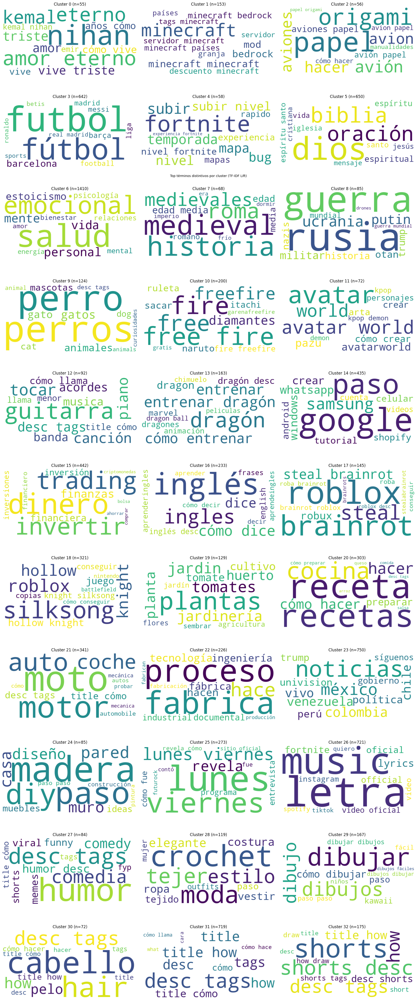

In [20]:


# ---------------------------------------------
# Utilidad: stopwords ES+EN (sin dependencias externas)
# (puedes reemplazar por NLTK si lo prefieres)
# ---------------------------------------------
STOP_ES = {
    "de","la","que","el","en","y","a","los","del","se","las","por","un","para","con","no","una","su","al","lo",
    "como","más","o","pero","sus","le","ya","o","este","sí","porque","esta","entre","cuando","muy","sin","sobre",
    "también","me","hasta","hay","donde","quien","desde","todo","nos","durante","todos","uno","les","ni","contra",
    "otros","ese","eso","ante","ellos","e","esto","mí","antes","algunos","qué","unos","yo","otro","otras","otra",
    "él","tanto","esa","estos","mucho","quienes","nada","muchos","cual","poco","ella","estar","estas","algunas",
    "algo","nosotros","mi","mis","tú","te","ti","tu","tus","ellas","nosotras","vosostros","vosotras","os",
    "mío","mía","míos","mías","tuyo","tuya","tuyos","tuyas","suyo","suya","suyos","suyas","nuestro","nuestra",
    "nuestros","nuestras","vuestro","vuestra","vuestros","vuestras","esos","esas","estoy","estás","está","estamos",
    "estáis","están","esté","estés","estemos","estéis","estén","estaré","estarás","estará","estaremos","estaréis",
    "estarán","estaba","estabas","estábamos","estabais","estaban","estuve","estuviste","estuvo","estuvimos",
    "estuvisteis","estuvieron","estuviera","estuvieras","estuviéramos","estuvierais","estuvieran","estuviese",
    "estuvieses","estuviésemos","estuvieseis","estuviesen","estando","estado","estada","estados","estadas","estad"
}
STOP_EN = {
    "the","a","an","and","or","if","then","else","when","of","for","on","in","to","from","by","with","without","about",
    "as","is","are","was","were","be","been","being","at","this","that","these","those","it","its","into","than","so",
    "such","not","no","but","can","cannot","could","should","would","will","just","only","over","under","again","both",
    "more","most","less","least","very","do","does","did","doing","done","up","down","out","off","your","you","yours",
    "we","our","ours","they","their","theirs","i","me","my","mine","he","him","his","she","her","hers","them","us"
}
STOPWORDS = STOP_ES | STOP_EN

# ---------------------------------------------
# Limpieza ligera para TF-IDF (mantiene # y @)
# ---------------------------------------------
def _clean_for_tfidf(s: str) -> str:
    s = str(s).lower()
    s = re.sub(r"https?://\S+|www\.\S+", " ", s)         # quitar urls
    s = re.sub(r"[^\wáéíóúñü#@\s]", " ", s)              # conserva # y @
    toks = [t for t in s.split() if t not in STOPWORDS and len(t) > 2]
    return " ".join(toks)

# ---------------------------------------------
# Función principal
# ---------------------------------------------
def top_terms_by_cluster(
    df: pd.DataFrame,
    text_col: str = "text_video",           # texto bruto (título+desc+tags)
    cluster_col: str = "cluster_umap5",     # etiquetas de cluster (HDBSCAN)
    top_n: int = 12,                         # nº de términos a devolver por cluster
    min_docs: int = 25,                      # mínimo de vídeos para considerar el cluster
    max_features: int = 8000,                # vocabulario TF-IDF
    ngram_range: tuple = (1,2),              # unigrams + bigrams por defecto
    exclude_noise: bool = True               # descartar cluster -1
) -> pd.DataFrame:
    """
    Devuelve un DataFrame con los 'top_n' términos más 'centrales' por cluster,
    medidos como LIFT = (media TF-IDF del cluster) - (media TF-IDF global).
    """
    # 0) opcional: excluir ruido
    data = df.copy()
    if exclude_noise and cluster_col in data.columns:
        data = data[data[cluster_col] != -1]

    # 1) limpiar texto para TF-IDF (no uses este texto para embeddings)
    text_clean = data[text_col].fillna("").map(_clean_for_tfidf)

    # 2) TF-IDF global (fit sobre todo el corpus)
    vec = TfidfVectorizer(stop_words=None, max_features=max_features, ngram_range=ngram_range)
    Xt = vec.fit_transform(text_clean)
    terms = vec.get_feature_names_out()
    Xt = Xt.tocsc()  # acceso por columnas más rápido

    # 3) medias globales
    global_mean = Xt.mean(axis=0).A1  # (V,)

    # 4) calcular lift por cluster
    rows = []
    for cl, idx in data.groupby(cluster_col).indices.items():
        if len(idx) < min_docs:
            continue
        cluster_mean = Xt[idx].mean(axis=0).A1
        lift = cluster_mean - global_mean
        top_idx = np.argsort(lift)[-top_n:][::-1]
        selected = [(terms[i], float(lift[i]), float(cluster_mean[i])) for i in top_idx if lift[i] > 0]
        if not selected:
            continue
        for term, lift_val, mean_val in selected:
            rows.append({
                "cluster": cl,
                "term": term,
                "lift": lift_val,           # exceso vs corpus (cuanto más >0, más distintivo del cluster)
                "tfidf_cluster_mean": mean_val,
                "docs_in_cluster": len(idx)
            })

    out = pd.DataFrame(rows).sort_values(["cluster", "lift"], ascending=[True, False])
    return out

# ---------------------------------------------
# Uso típico
# ---------------------------------------------

# - df["text_video"]            -> texto bruto (para embeddings)
# - df["cluster_umap5"]         -> etiquetas de cluster (HDBSCAN en UMAP 5D)
# #Primero genera una versión limpia SOLO para TF-IDF interpretativo (no para embeddings):
df_1["text_video_clean"] = df_1["text_video"].map(_clean_for_tfidf)

#Y luego llama:
keywords = top_terms_by_cluster(
    df_1.assign(text_video=df_1["text_video"]), # o cambia text_col="text_video_clean"
    text_col="text_video_clean",
    cluster_col="cluster_umap5",
    top_n=12, min_docs=25,
    max_features=8000, ngram_range=(1,2),
    exclude_noise=True
)
display(keywords)
n_clusters = len(keywords)
n_cols = 3
n_rows = int(np.ceil(n_clusters / n_cols))

n_clusters = keywords["cluster"].nunique()
n_cols = 3
n_rows = int(np.ceil(n_clusters / n_cols))

plt.figure(figsize=(n_cols*6, n_rows*4))

for i, cl in enumerate(sorted(keywords["cluster"].unique())):
    cluster_terms = keywords[keywords["cluster"] == cl]
    if cluster_terms.empty:
        continue
    
    # Diccionario término:lift para ponderar WordCloud
    frequencies = dict(zip(cluster_terms["term"], cluster_terms["lift"]))
    if not frequencies:
        continue
    
    ax = plt.subplot(n_rows, n_cols, i+1)
    wc = WordCloud(width=600, height=300, background_color="white").generate_from_frequencies(frequencies)
    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")
    ax.set_title(f"Cluster {cl} (n={cluster_terms['docs_in_cluster'].iloc[0]})", fontsize=12)

plt.tight_layout()
plt.suptitle("Top términos distintivos por cluster (TF-IDF Lift)", fontsize=10, y=0.82)
plt.show()

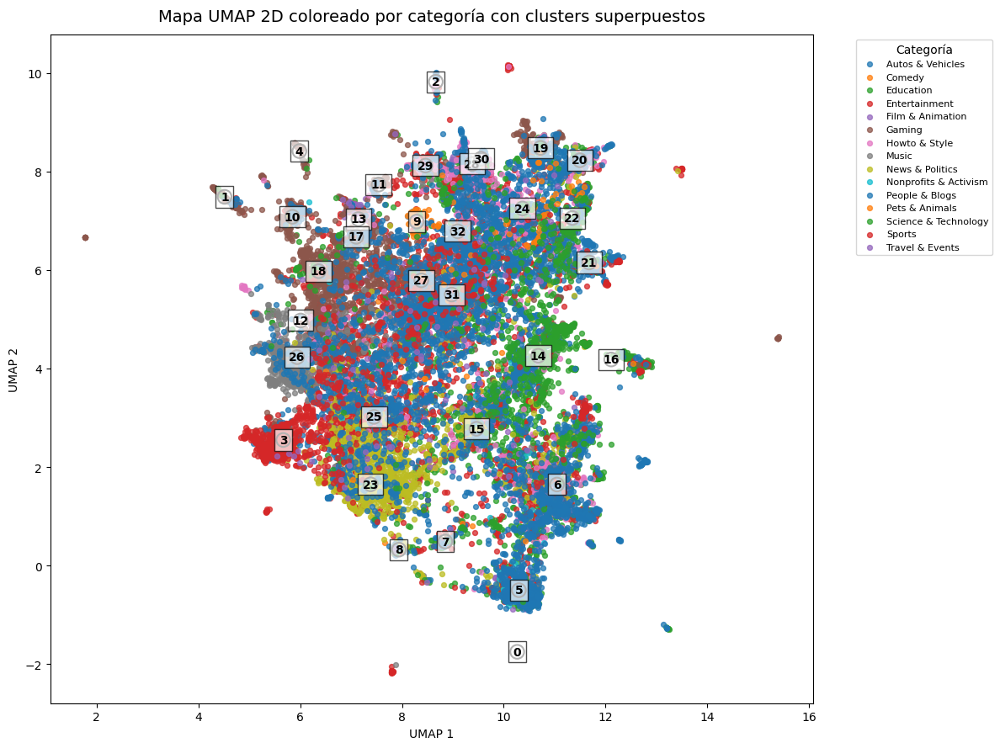

In [21]:
plt.figure(figsize=(12, 9))

# 1) Puntos coloreados por categoría
for cat, group in df_1.groupby("category_name"):
    plt.scatter(group["umap2_x"], group["umap2_y"],
                label=cat, s=18, alpha=0.75)

# 2) Centroides por cluster (sin ruido -1)
centroids = (
    df_1[df_1["cluster_umap5"] != -1]
    .groupby("cluster_umap5")[["umap2_x", "umap2_y"]]
    .mean()
    .reset_index()
)

# 3) Marcar centroides (anillo) y superponer el número del cluster
plt.scatter(centroids["umap2_x"], centroids["umap2_y"],
            s=140, facecolors="none", edgecolors="black", linewidths=1.5, zorder=3)

for _, row in centroids.iterrows():
    plt.text(row["umap2_x"], row["umap2_y"], str(int(row["cluster_umap5"])),
             fontsize=10, fontweight="bold", ha="center", va="center",
             bbox=dict(facecolor="white", alpha=0.7, edgecolor="black"),
             zorder=4)

plt.title("Mapa UMAP 2D coloreado por categoría con clusters superpuestos", fontsize=14, pad=12)
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
plt.legend(title="Categoría", bbox_to_anchor=(1.05, 1), loc="upper left", ncol=1, fontsize=8)
plt.tight_layout()
plt.show()

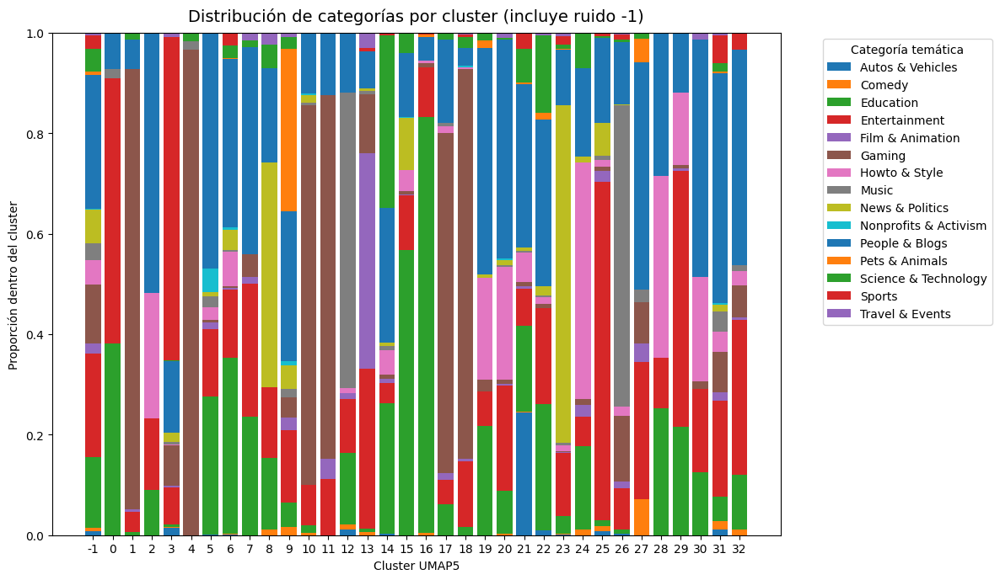

In [22]:
prop = (
    pd.crosstab(df_1["cluster_umap5"], df_1["category_name"], normalize="index")
    .sort_index()
)

# --- Gráfico de barras apiladas ---
plt.figure(figsize=(12, 7))
bottom = np.zeros(len(prop))
xlabels = prop.index.astype(str)

for cat in prop.columns:
    plt.bar(xlabels, prop[cat].values, bottom=bottom, label=cat)
    bottom += prop[cat].values

# --- Personalización ---
plt.title("Distribución de categorías por cluster (incluye ruido -1)", fontsize=14, pad=10)
plt.xlabel("Cluster UMAP5")
plt.ylabel("Proporción dentro del cluster")
plt.ylim(0, 1)
plt.legend(title="Categoría temática", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

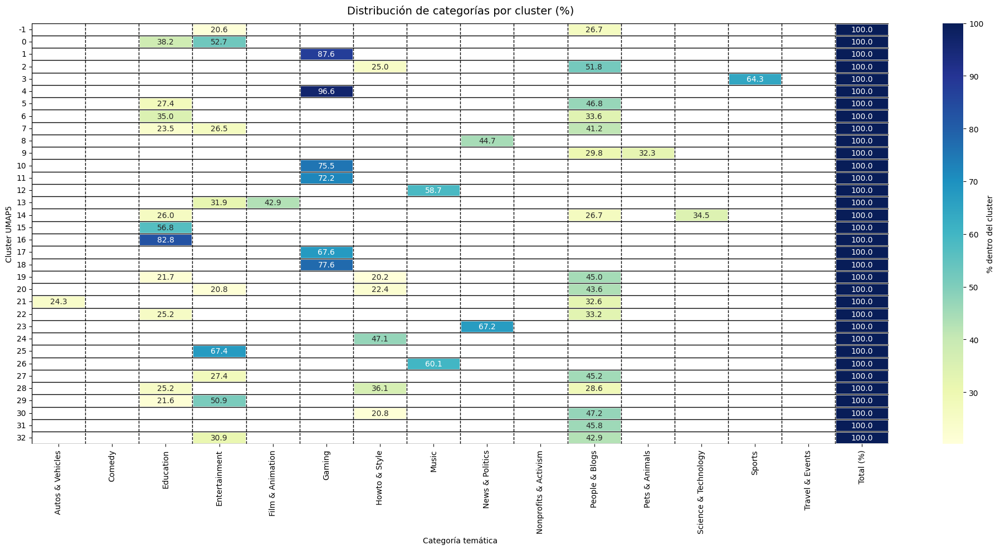

In [23]:
# --- Tabla base: porcentaje por cluster ---
ct = pd.crosstab(df_1["cluster_umap5"], df_1["category_name"], normalize="index") * 100

# --- Añadir columna "Total (%)" ---
ct["Total (%)"] = 100

# --- Crear máscara (oculta valores < 20%) ---
mask = ct < 20
mask["Total (%)"] = False

# --- Crear figura ---
plt.figure(figsize=(20, 10))
ax = sns.heatmap(
    ct,
    cmap="YlGnBu",
    annot=True,
    fmt=".1f",
    mask=mask,
    linewidths=1,
    linecolor="white",
    cbar_kws={"label": "% dentro del cluster"}
)

# --- Título y etiquetas ---
plt.title("Distribución de categorías por cluster (%)", fontsize=14, pad=12)
plt.xlabel("Categoría temática")
plt.ylabel("Cluster UMAP5")
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha="right", fontsize=10)


# --- Líneas horizontales finas (negras) ---
for y in range(1, ct.shape[0]):
    ax.axhline(y, color="black", linewidth=1, linestyle="-")

# --- Líneas verticales punteadas ---
for x in range(1, ct.shape[1]):
    ax.axvline(x, color="black", linestyle="--", linewidth=1)

# --- Opcional: marco del heatmap ---
ax.axhline(0, color="black", linewidth=1)
ax.axhline(ct.shape[0], color="black", linewidth=1)
ax.axvline(0, color="black", linewidth=1)
ax.axvline(ct.shape[1], color="black", linewidth=1)

plt.tight_layout()
plt.show()

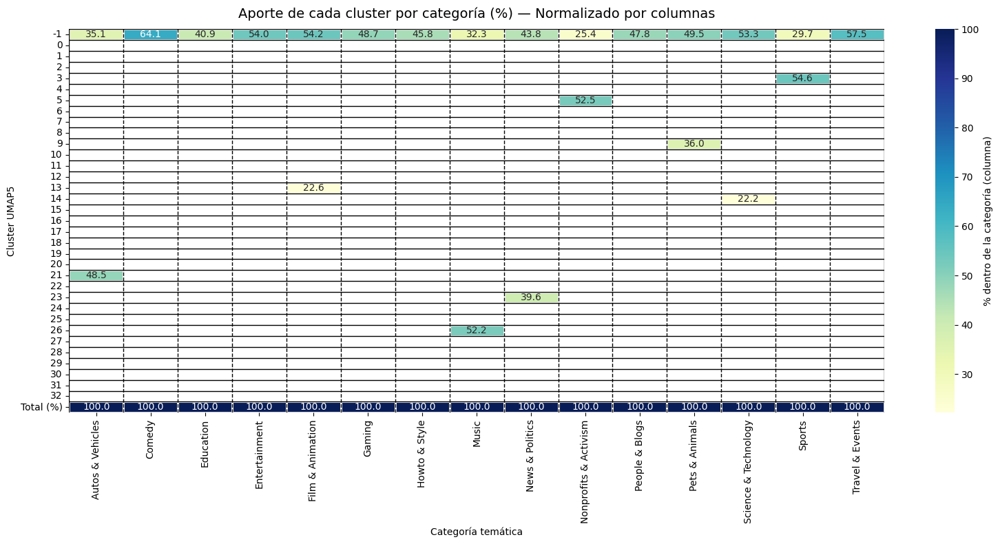

In [24]:
# --- Tabla base: % por columna (cada categoría suma 100) ---
ct = pd.crosstab(
    df_1["cluster_umap5"], 
    df_1["category_name"], 
    normalize="columns"
) * 100

# --- Añadir fila "Total (%)" = 100 en cada columna ---
ct.loc["Total (%)"] = 100

# --- Máscara: ocultar valores < 20% (pero no la fila Total) ---
mask = ct < 20
mask.loc["Total (%)"] = False

# --- Figura ---
plt.figure(figsize=(16, 8))
ax = sns.heatmap(
    ct,
    cmap="YlGnBu",
    annot=True,
    fmt=".1f",
    mask=mask,
    linewidths=1,
    linecolor="white",
    cbar_kws={"label": "% dentro de la categoría (columna)"}  # aporta de cada cluster
)

# --- Títulos y ejes ---
plt.title("Aporte de cada cluster por categoría (%) — Normalizado por columnas", fontsize=14, pad=12)
plt.xlabel("Categoría temática")
plt.ylabel("Cluster UMAP5")

# --- Líneas horizontales finas (negras) entre filas ---
for y in range(1, ct.shape[0]):
    ax.axhline(y, color="black", linewidth=1, linestyle="-")

# --- Líneas verticales punteadas entre columnas ---
for x in range(1, ct.shape[1]):
    ax.axvline(x, color="black", linewidth=1, linestyle="--")

# --- Marco opcional ---
ax.axhline(0, color="black", linewidth=1)
ax.axhline(ct.shape[0], color="black", linewidth=1)
ax.axvline(0, color="black", linewidth=1)
ax.axvline(ct.shape[1], color="black", linewidth=1)

plt.tight_layout()
plt.show()

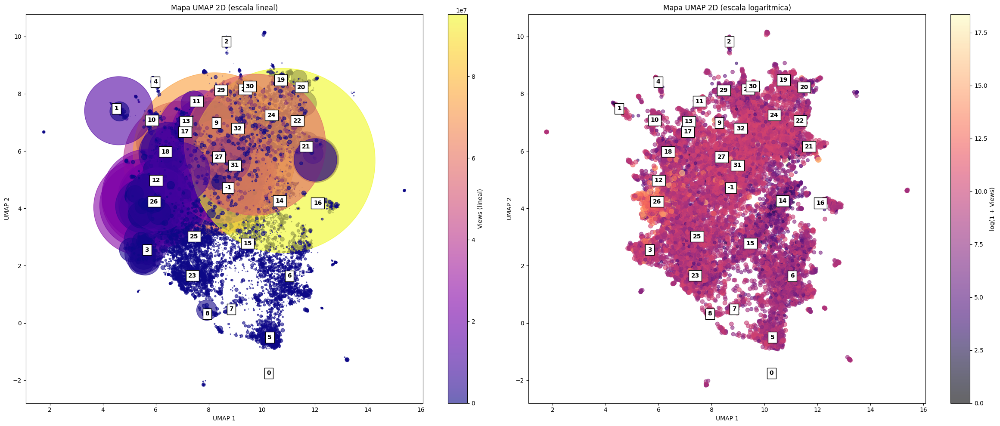

In [25]:

plt.figure(figsize=(24,10))

# --- Centroides de clusters ---
centroids = df_1.groupby("cluster_umap5")[["umap2_x", "umap2_y"]].mean().reset_index()


plt.subplot(1,2,1)
plt.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=df_1["views"], cmap="plasma",
    s=df_1["views"]/1000, alpha=0.6
)
plt.colorbar(label="Views (lineal)")
plt.title("Mapa UMAP 2D (escala lineal)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

# Añadir números de cluster sobre centroides
for _, row in centroids.iterrows():
    plt.text(row["umap2_x"], row["umap2_y"], str(int(row["cluster_umap5"])),
             fontsize=10, fontweight="bold", ha="center", va="center",
             color="black", bbox=dict(facecolor="white", alpha=1, edgecolor="black"))


plt.subplot(1,2,2)
plt.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=np.log1p(df_1["views"]), cmap="magma",
    s=np.log1p(df_1["views"])*5, alpha=0.6
)
plt.colorbar(label="log(1 + Views)")
plt.title("Mapa UMAP 2D (escala logarítmica)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

# Añadir los números de cluster también aquí
for _, row in centroids.iterrows():
    plt.text(row["umap2_x"], row["umap2_y"], str(int(row["cluster_umap5"])),
             fontsize=10, fontweight="bold", ha="center", va="center",
             color="black", bbox=dict(facecolor="white", alpha=1, edgecolor="black"))

plt.tight_layout()
plt.show()

In [26]:
z=df_1.groupby("cluster_umap5")["views"].median().sort_values(ascending=False).head()
print(f"valores de likes por /{z}")

valores de likes por /cluster_umap5
26    67047.0
27    25700.5
11    25255.0
32    24650.0
31    21086.0
Name: views, dtype: float64


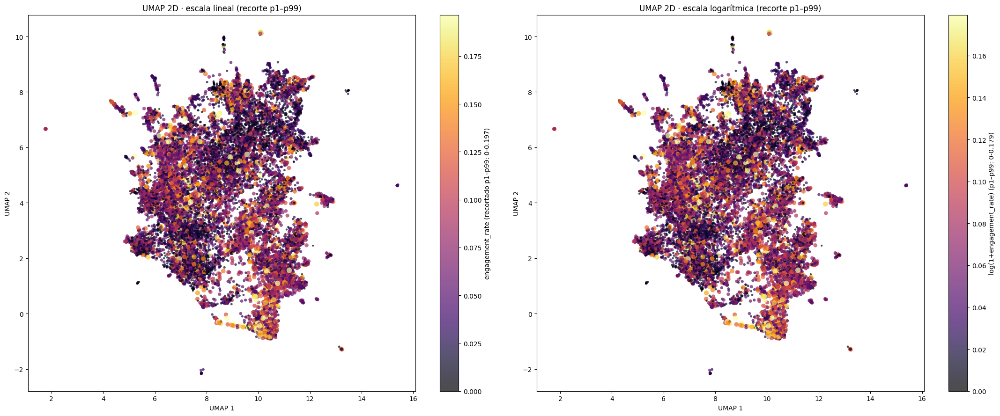

In [27]:


er = df_1["engagement_rate"].astype(float).clip(lower=0).replace([np.inf, -np.inf], np.nan).fillna(0)

# Percentiles para recortar (evita que unos pocos outliers “aplasten” el resto)
p1, p99 = np.percentile(er, [1, 99])
er_clip = np.clip(er, p1, p99)

# Normaliza a 0–1 para tamaños (y añade tamaño mínimo para que siempre se vean)
er_norm = (er_clip - p1) / (p99 - p1 + 1e-9)
sizes = 8 + 60*er_norm            # 8–68 pts

# Versión log (mejor separación si hay cola larga)
er_log = np.log1p(er)
lp1, lp99 = np.percentile(er_log, [1, 99])
sizes_log = 8 + 60*((np.clip(er_log, lp1, lp99)-lp1)/(lp99-lp1+1e-9))

plt.figure(figsize=(22,9))

# --- A) Color y tamaño lineales, pero recortados por percentil ---
ax1 = plt.subplot(1,2,1)
sc1 = ax1.scatter(df_1["umap2_x"], df_1["umap2_y"],
                  c=er_clip, s=sizes, cmap="inferno", alpha=0.7, edgecolors="none",
                  vmin=p1, vmax=p99)
plt.colorbar(sc1, ax=ax1, label=f"engagement_rate (recortado p1–p99: {p1:.3g}-{p99:.3g})")
ax1.set_title("UMAP 2D · escala lineal (recorte p1–p99)")
ax1.set_xlabel("UMAP 1"); ax1.set_ylabel("UMAP 2")

# --- B) Color y tamaño en LOG + recorte percentil ---
ax2 = plt.subplot(1,2,2)
sc2 = ax2.scatter(df_1["umap2_x"], df_1["umap2_y"],
                  c=np.clip(er_log, lp1, lp99), s=sizes_log, cmap="inferno", alpha=0.7, edgecolors="none",
                  vmin=lp1, vmax=lp99)
plt.colorbar(sc2, ax=ax2, label=f"log(1+engagement_rate) (p1–p99: {lp1:.3g}-{lp99:.3g})")
ax2.set_title("UMAP 2D · escala logarítmica (recorte p1–p99)")
ax2.set_xlabel("UMAP 1"); ax2.set_ylabel("UMAP 2")

plt.tight_layout()
plt.show()

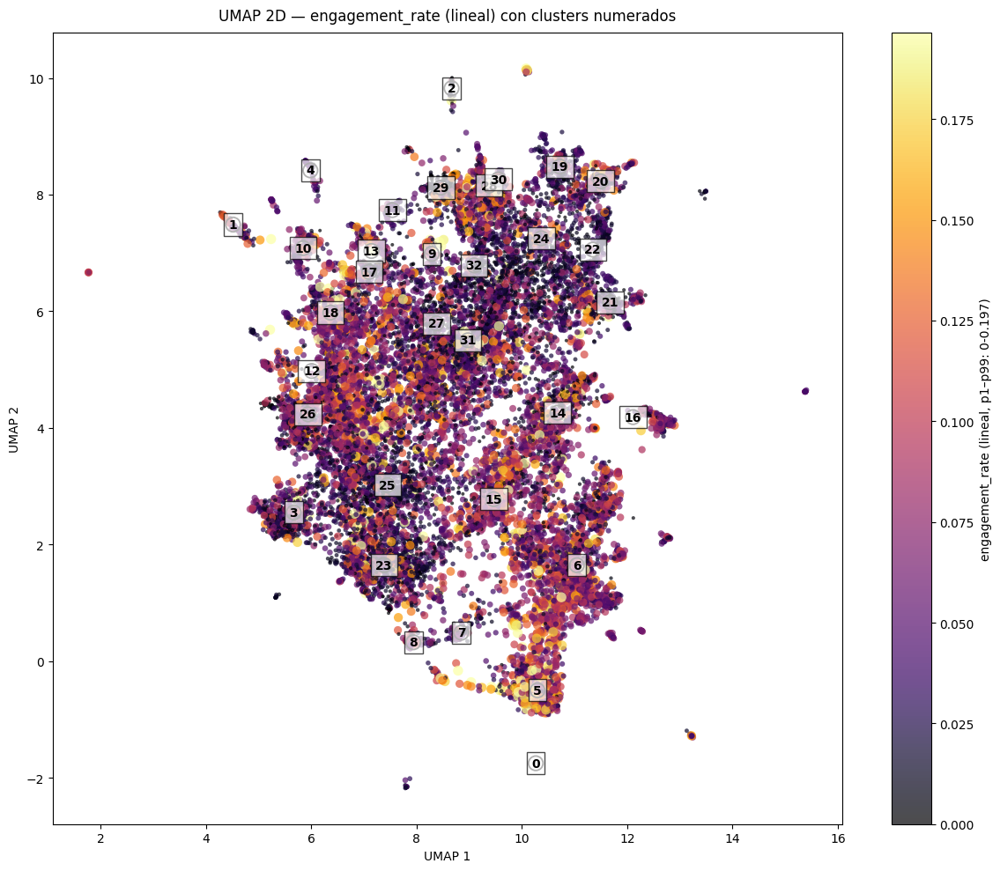

In [28]:
er = (df_1["engagement_rate"]
      .astype(float).clip(lower=0)
      .replace([np.inf, -np.inf], np.nan).fillna(0))

p1, p99 = np.percentile(er, [1, 99])
er_clip = np.clip(er, p1, p99)

# tamaño (lineal) con mínimo para que se vean todos
sizes = 8 + 60 * ((er_clip - p1) / (p99 - p1 + 1e-9))

plt.figure(figsize=(12, 10))

# --- scatter UMAP en escala lineal ---
sc = plt.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=er_clip, cmap="inferno", s=sizes,
    alpha=0.7, edgecolors="none", vmin=p1, vmax=p99
)
plt.colorbar(sc, label=f"engagement_rate (lineal, p1–p99: {p1:.3g}-{p99:.3g})")

# --- centroides y números de cluster (omite ruido -1) ---
centroids = (df_1[df_1["cluster_umap5"] != -1]
             .groupby("cluster_umap5")[["umap2_x", "umap2_y"]]
             .mean().reset_index())

plt.scatter(centroids["umap2_x"], centroids["umap2_y"],
            s=140, facecolors="none", edgecolors="black", linewidths=1.3, zorder=3)

for _, row in centroids.iterrows():
    plt.text(row["umap2_x"], row["umap2_y"], str(int(row["cluster_umap5"])),
             fontsize=10, fontweight="bold", ha="center", va="center",
             bbox=dict(facecolor="white", alpha=0.7, edgecolor="black"), zorder=4)

plt.title("UMAP 2D — engagement_rate (lineal) con clusters numerados", pad=10)
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
plt.tight_layout()
plt.show()

In [29]:
df_1.groupby("cluster_umap5")["engagement_rate"].median().sort_values(ascending=False).head()

cluster_umap5
5     0.073765
15    0.056342
13    0.054714
6     0.053773
28    0.052222
Name: engagement_rate, dtype: float64

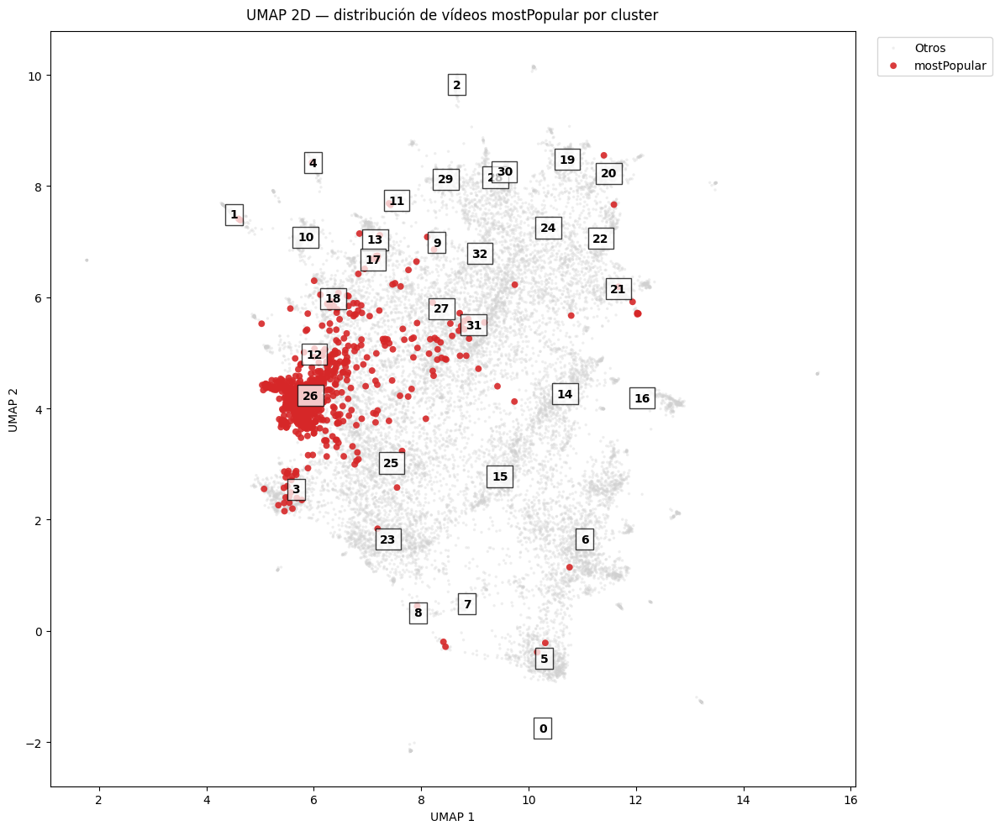

In [30]:
mask_pop = df_1["mostpopular"] == 1

plt.figure(figsize=(12,10))

# Fondo: todos los puntos (no mostPopular) en gris
plt.scatter(
    df_1.loc[~mask_pop, "umap2_x"], df_1.loc[~mask_pop, "umap2_y"],
    s=6, c="#d0d0d0", alpha=0.35, edgecolors="none", label="Otros"
)

# Resaltado: mostPopular en color intenso
plt.scatter(
    df_1.loc[mask_pop, "umap2_x"], df_1.loc[mask_pop, "umap2_y"],
    s=32, c="#d62728", alpha=0.9, edgecolors="none", label="mostPopular"
)

# Centroides y números de cluster (omite ruido -1)
centroids = (
    df_1.groupby("cluster_umap5")[["umap2_x","umap2_y"]]
        .mean()
        .reset_index()
)
for _, row in centroids.iterrows():
    cl = int(row["cluster_umap5"])
    if cl == -1:
        continue
    plt.text(
        row["umap2_x"], row["umap2_y"], str(cl),
        fontsize=10, fontweight="bold", ha="center", va="center",
        bbox=dict(facecolor="white", alpha=0.75, edgecolor="black")
    )

plt.title("UMAP 2D — distribución de vídeos mostPopular por cluster", pad=10)
plt.xlabel("UMAP 1"); plt.ylabel("UMAP 2")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

In [31]:
df_1.groupby("cluster_umap5")["mostpopular"].median().sort_values(ascending=False).head()

cluster_umap5
 26    1.0
-1     0.0
 24    0.0
 18    0.0
 19    0.0
Name: mostpopular, dtype: float64

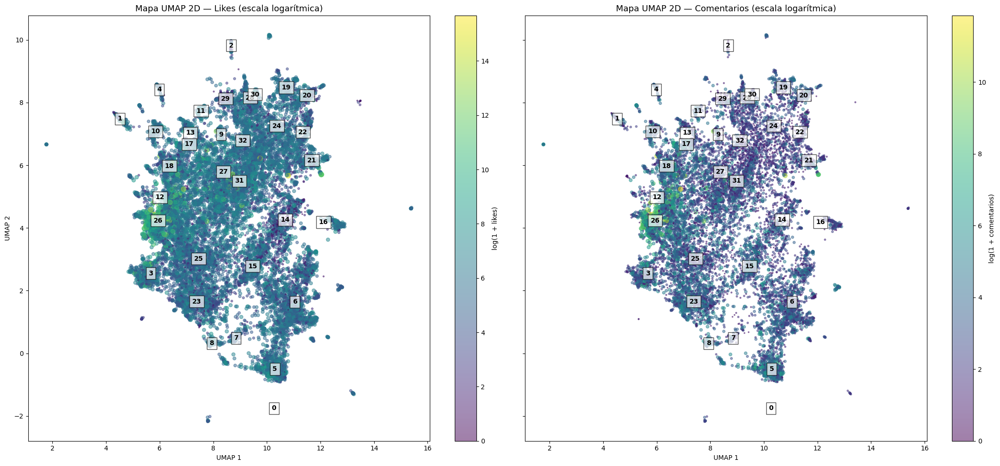

In [32]:



centroids = (
    df_1.groupby("cluster_umap5")[["umap2_x", "umap2_y"]]
    .mean()
    .reset_index()
)


fig, axes = plt.subplots(1, 2, figsize=(22, 10), sharex=True, sharey=True)


ax = axes[0]
sc1 = ax.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=np.log1p(df_1["likes"]),
    cmap="viridis",
    s=np.log1p(df_1["likes"]) * 4,
    alpha=0.5
)
fig.colorbar(sc1, ax=ax, label="log(1 + likes)")
ax.set_title("Mapa UMAP 2D — Likes (escala logarítmica)", fontsize=13)
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")

# Números de clúster
for _, row in centroids.iterrows():
    cl = int(row["cluster_umap5"])
    if cl == -1:
        continue
    ax.text(
        row["umap2_x"], row["umap2_y"], str(cl),
        fontsize=10, fontweight="bold", ha="center", va="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="black")
    )


ax = axes[1]
sc2 = ax.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=np.log1p(df_1["comments"]),
    cmap="viridis",
    s=np.log1p(df_1["comments"]) * 4,
    alpha=0.5
)
fig.colorbar(sc2, ax=ax, label="log(1 + comentarios)")
ax.set_title("Mapa UMAP 2D — Comentarios (escala logarítmica)", fontsize=13)
ax.set_xlabel("UMAP 1")

# Números de clúster
for _, row in centroids.iterrows():
    cl = int(row["cluster_umap5"])
    if cl == -1:
        continue
    ax.text(
        row["umap2_x"], row["umap2_y"], str(cl),
        fontsize=10, fontweight="bold", ha="center", va="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="black")
    )


plt.tight_layout()
plt.show()

In [33]:
df_1.groupby("cluster_umap5")["likes"].median().sort_values(ascending=False).head()
df_1.groupby("cluster_umap5")["comments"].median().sort_values(ascending=False).head()

cluster_umap5
26    48.0
8     32.0
18    26.0
4     24.0
11    23.0
Name: comments, dtype: float64

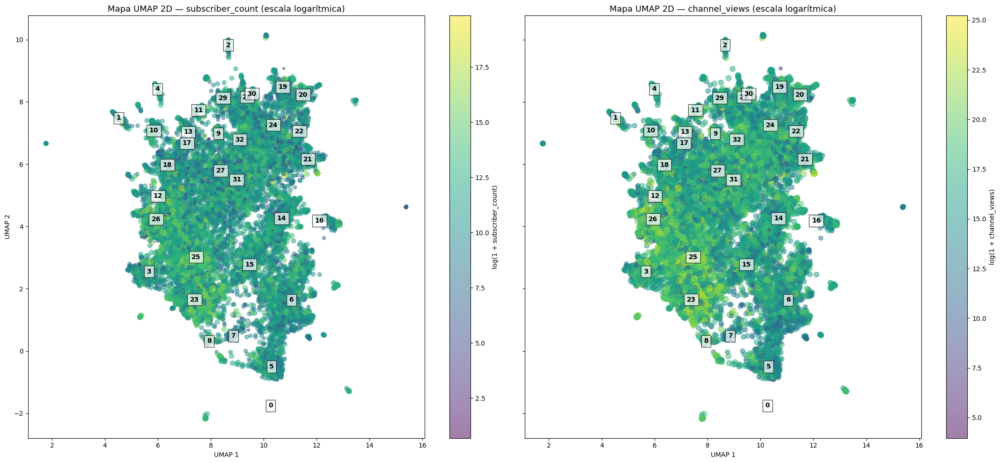

In [34]:
import numpy as np
import matplotlib.pyplot as plt


centroids = (
    df_1.groupby("cluster_umap5")[["umap2_x", "umap2_y"]]
    .mean()
    .reset_index()
)


fig, axes = plt.subplots(1, 2, figsize=(22, 10), sharex=True, sharey=True)


ax = axes[0]
sc1 = ax.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=np.log1p(df_1["subscriber_count"]),
    cmap="viridis",
    s=np.log1p(df_1["subscriber_count"]) * 4,
    alpha=0.5
)
fig.colorbar(sc1, ax=ax, label="log(1 + subscriber_count)")
ax.set_title("Mapa UMAP 2D — subscriber_count (escala logarítmica)", fontsize=13)
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")

# Números de clúster
for _, row in centroids.iterrows():
    cl = int(row["cluster_umap5"])
    if cl == -1:
        continue
    ax.text(
        row["umap2_x"], row["umap2_y"], str(cl),
        fontsize=10, fontweight="bold", ha="center", va="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="black")
    )


ax = axes[1]
sc2 = ax.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=np.log1p(df_1["channel_views"]),
    cmap="viridis",
    s=np.log1p(df_1["channel_views"]) * 4,
    alpha=0.5
)
fig.colorbar(sc2, ax=ax, label="log(1 + channel_views)")
ax.set_title("Mapa UMAP 2D — channel_views (escala logarítmica)", fontsize=13)
ax.set_xlabel("UMAP 1")

# Números de clúster
for _, row in centroids.iterrows():
    cl = int(row["cluster_umap5"])
    if cl == -1:
        continue
    ax.text(
        row["umap2_x"], row["umap2_y"], str(cl),
        fontsize=10, fontweight="bold", ha="center", va="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="black")
    )

plt.tight_layout()
plt.show()

In [35]:
df_1.groupby("cluster_umap5")["subscriber_count"].median().sort_values(ascending=False).head()

cluster_umap5
0     665000.0
25    578000.0
4     406000.0
23    257000.0
26    176000.0
Name: subscriber_count, dtype: float64

In [36]:
df_1.groupby("cluster_umap5")["channel_views"].median().sort_values(ascending=False).head()

cluster_umap5
0     410810699.0
25    272872346.0
26     86356502.0
23     68975956.5
4      36839404.5
Name: channel_views, dtype: float64

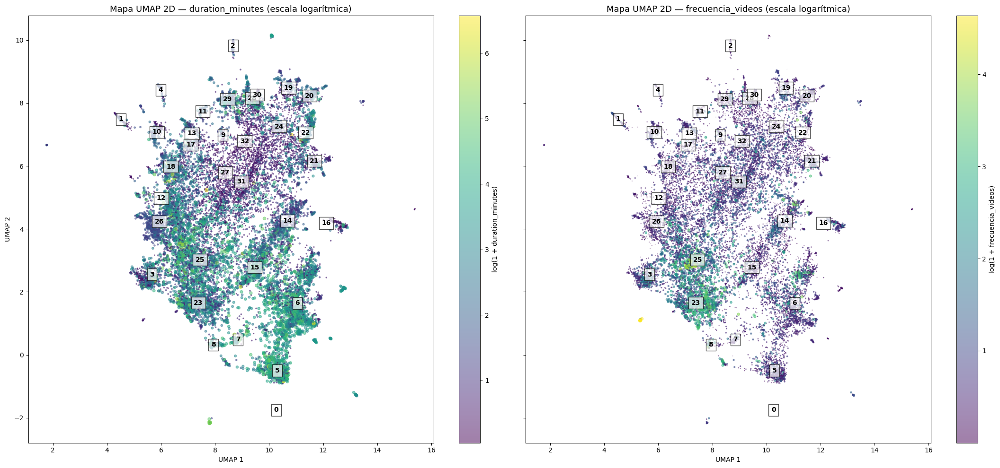

In [37]:


centroids = (
    df_1.groupby("cluster_umap5")[["umap2_x", "umap2_y"]]
    .mean()
    .reset_index()
)


fig, axes = plt.subplots(1, 2, figsize=(22, 10), sharex=True, sharey=True)


ax = axes[0]
sc1 = ax.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=np.log1p(df_1["duration_minutes"]),
    cmap="viridis",
    s=np.log1p(df_1["duration_minutes"]) * 4,
    alpha=0.5
)
fig.colorbar(sc1, ax=ax, label="log(1 + duration_minutes)")
ax.set_title("Mapa UMAP 2D — duration_minutes (escala logarítmica)", fontsize=13)
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")

# Números de clúster
for _, row in centroids.iterrows():
    cl = int(row["cluster_umap5"])
    if cl == -1:
        continue
    ax.text(
        row["umap2_x"], row["umap2_y"], str(cl),
        fontsize=10, fontweight="bold", ha="center", va="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="black")
    )


ax = axes[1]
sc2 = ax.scatter(
    df_1["umap2_x"], df_1["umap2_y"],
    c=np.log1p(df_1["frecuencia_videos"]),
    cmap="viridis",
    s=np.log1p(df_1["frecuencia_videos"]) * 4,
    alpha=0.5
)
fig.colorbar(sc2, ax=ax, label="log(1 + frecuencia_videos)")
ax.set_title("Mapa UMAP 2D — frecuencia_videos (escala logarítmica)", fontsize=13)
ax.set_xlabel("UMAP 1")

# Números de clúster
for _, row in centroids.iterrows():
    cl = int(row["cluster_umap5"])
    if cl == -1:
        continue
    ax.text(
        row["umap2_x"], row["umap2_y"], str(cl),
        fontsize=10, fontweight="bold", ha="center", va="center",
        bbox=dict(facecolor="white", alpha=0.7, edgecolor="black")
    )

plt.tight_layout()
plt.show()

In [38]:
df_1.groupby("cluster_umap5")["duration_minutes"].median().sort_values(ascending=False).head()

cluster_umap5
0    133.000000
5     32.291667
7     26.366667
6     18.858333
8     17.916667
Name: duration_minutes, dtype: float64

In [39]:
df_1.groupby("cluster_umap5")["frecuencia_videos"].median().sort_values(ascending=False).head()

cluster_umap5
23    2.780826
25    2.657143
0     1.208696
10    0.986351
8     0.822917
Name: frecuencia_videos, dtype: float64

In [40]:
df_1.groupby("cluster_umap5")["duration_minutes"].median().sort_values(ascending=False).head()

cluster_umap5
0    133.000000
5     32.291667
7     26.366667
6     18.858333
8     17.916667
Name: duration_minutes, dtype: float64

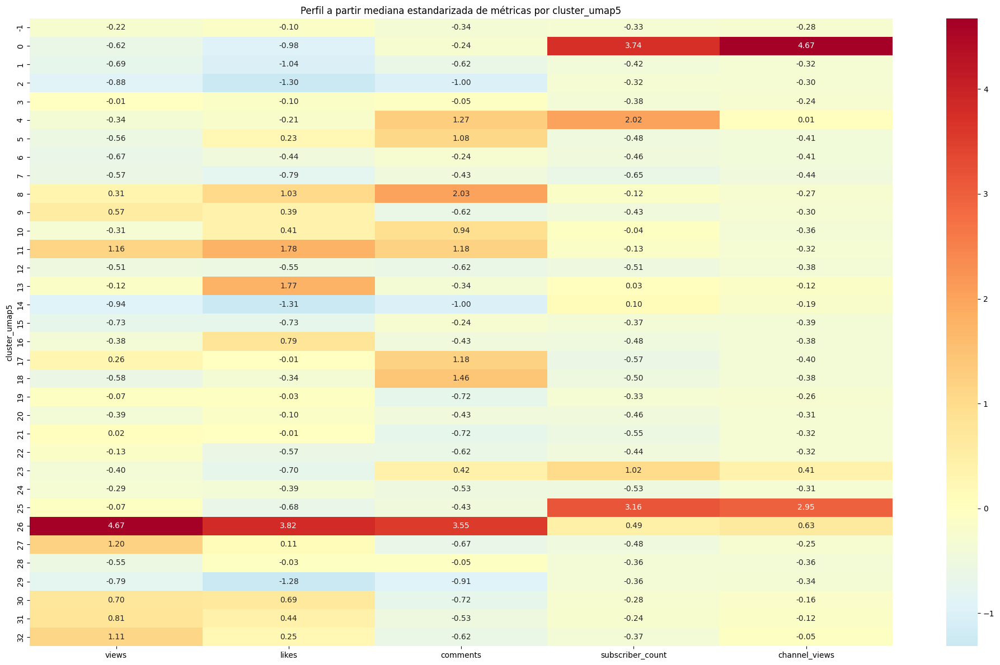

In [41]:
cols = ["views", "likes", "comments", "subscriber_count","channel_views"]
group = "cluster_umap5"  # o "category_name"

agg_z = df_1.groupby(group)[cols].median()
agg_z = pd.DataFrame(StandardScaler().fit_transform(agg_z), index=agg_z.index, columns=cols)

plt.figure(figsize=(20,12))
sns.heatmap(agg_z, cmap="RdYlBu_r", center=0, annot=True, fmt=".2f")
plt.title(f"Perfil a partir mediana estandarizada de métricas por {group}")
plt.ylabel(group)
plt.tight_layout()
plt.show()

/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/4246193818.py:25: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  DF[b] = DF[b].map({True: "Sí", False: "No", 1: "Sí", 0: "No"}).fillna(DF[b]).astype("category")
/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/4246193818.py:25: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  DF[b] = DF[b].map({True: "Sí", False: "No", 1: "Sí", 0: "No"}).fillna(DF[b]).astype("category")


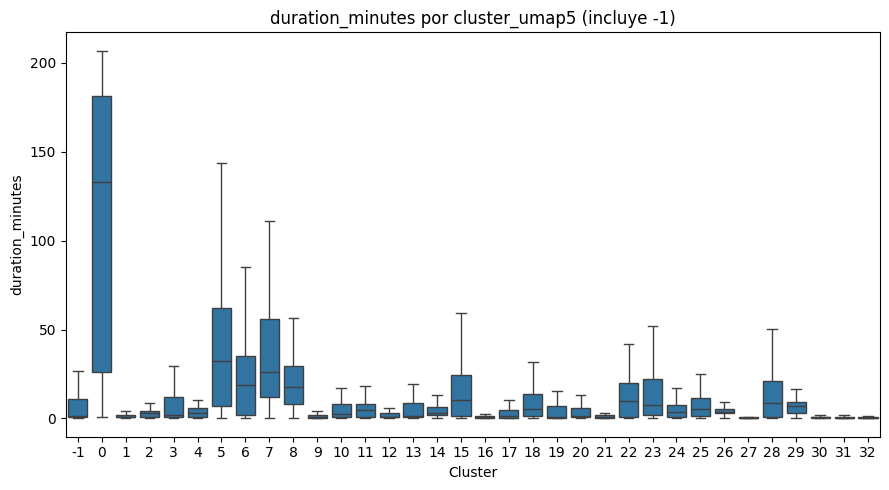

[Kruskal-Wallis] duration_minutes ~ cluster_umap5: H=3307.329, p=0.000e+00


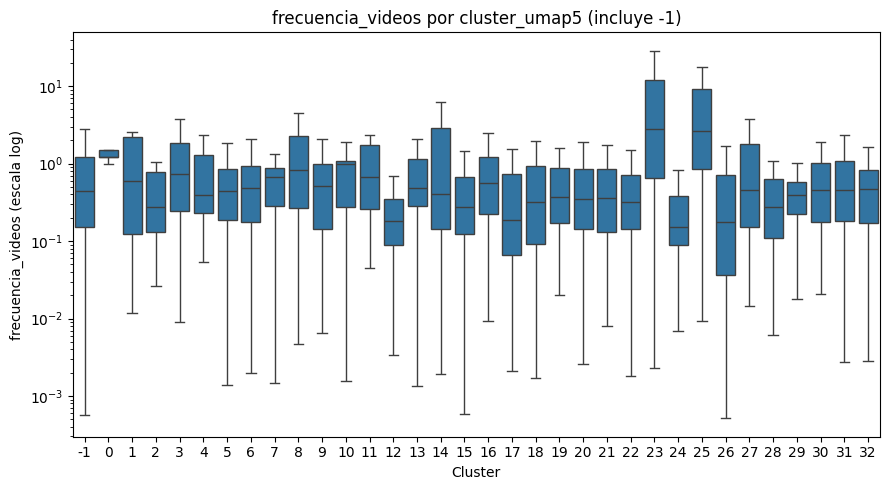

[Kruskal-Wallis] frecuencia_videos ~ cluster_umap5: H=1368.637, p=1.111e-266


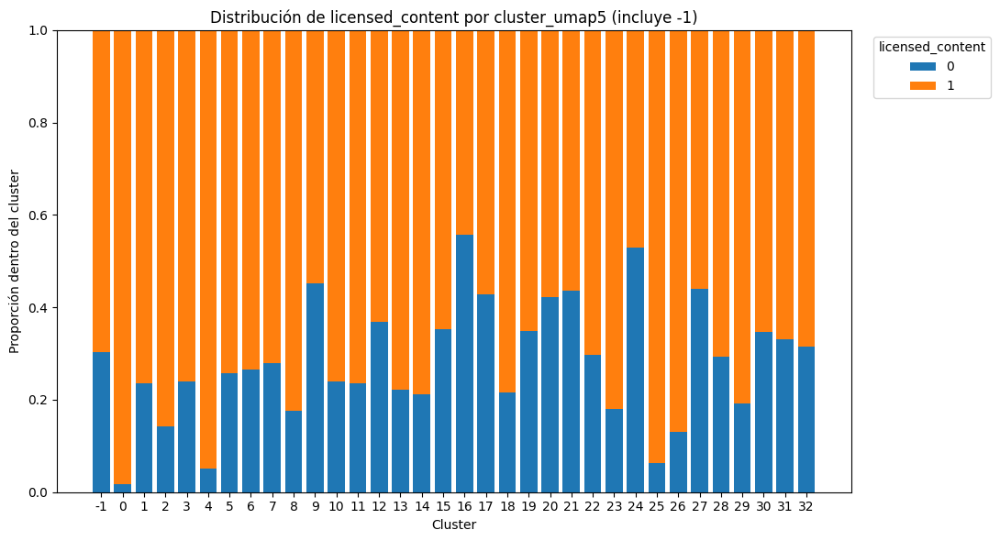

[Cramér’s V] licensed_content ~ cluster_umap5: V=0.174


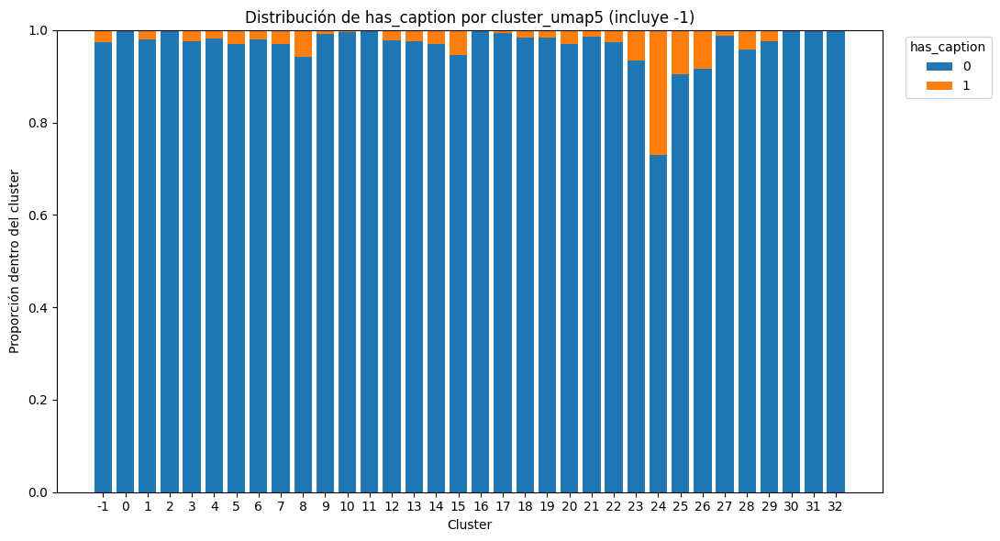

[Cramér’s V] has_caption ~ cluster_umap5: V=0.150


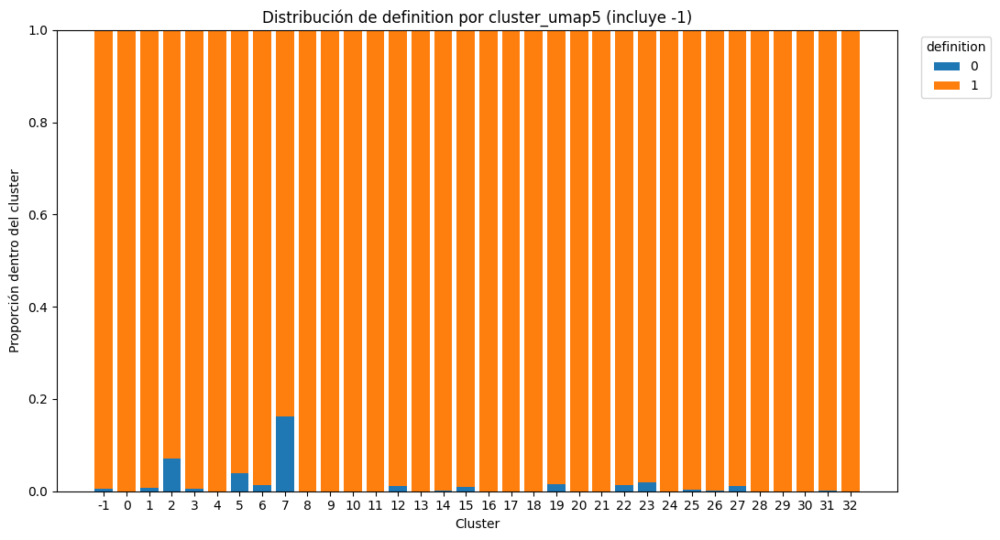

[Cramér’s V] definition ~ cluster_umap5: V=0.147


In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import kruskal
from sklearn.preprocessing import LabelEncoder

# =========================
# Configuración
# =========================
DF = df_1.copy()  # usa tu dataframe principal
CLUSTER_COL = "cluster_umap5"

num_vars = ["duration_minutes", "frecuencia_videos"]
cat_vars = ["licensed_content", "has_caption", "definition"]

# Tipos y limpieza mínima
for c in num_vars:
    if c in DF.columns:
        DF[c] = pd.to_numeric(DF[c], errors="coerce")

for b in ["licensed_content", "has_caption"]:
    if b in DF.columns:
        # 0/1 o True/False -> etiquetas legibles
        DF[b] = DF[b].map({True: "Sí", False: "No", 1: "Sí", 0: "No"}).fillna(DF[b]).astype("category")

if "definition" in DF.columns:
    DF["definition"] = DF["definition"].astype("category")

assert CLUSTER_COL in DF.columns, f"Falta columna {CLUSTER_COL}"

# Orden: -1 primero y luego ascendente
def ordered_clusters(s):
    return pd.Index(sorted(pd.unique(s), key=lambda x: (x != -1, x)))

# =========================
# 1) Numéricas por cluster (boxplots)
# =========================
for v in num_vars:
    if v not in DF.columns: 
        continue
    d = DF[[CLUSTER_COL, v]].dropna().copy()
    if d.empty: 
        continue
    order = ordered_clusters(d[CLUSTER_COL])

    plt.figure(figsize=(9,5))
    ax = sns.boxplot(data=d, x=CLUSTER_COL, y=v, order=order, showfliers=False)
    if v == "frecuencia_videos":
        ax.set_yscale("log")
        ax.set_ylabel(f"{v} (escala log)")
    plt.title(f"{v} por {CLUSTER_COL} (incluye -1)")
    plt.xlabel("Cluster")
    plt.tight_layout()
    plt.show()

    # Prueba no paramétrica (Kruskal-Wallis) entre clusters
    groups = [g[v].dropna().values for _, g in d.groupby(CLUSTER_COL)]
    if len(groups) > 1:
        stat, p = kruskal(*groups)
        print(f"[Kruskal-Wallis] {v} ~ {CLUSTER_COL}: H={stat:.3f}, p={p:.3e}")

# =========================
# 2) Categóricas por cluster (barras apiladas)
# =========================
for v in cat_vars:
    if v not in DF.columns: 
        continue
    d = DF[[CLUSTER_COL, v]].dropna().copy()
    if d.empty:
        continue
    order = ordered_clusters(d[CLUSTER_COL])
    prop = (pd.crosstab(d[CLUSTER_COL], d[v], normalize="index")
              .reindex(order, axis=0)
              .sort_index(axis=1))

    plt.figure(figsize=(11,6))
    bottom = np.zeros(len(prop))
    xlabels = prop.index.astype(str)
    for cat in prop.columns:
        plt.bar(xlabels, prop[cat].values, bottom=bottom, label=cat)
        bottom += prop[cat].values

    plt.title(f"Distribución de {v} por {CLUSTER_COL} (incluye -1)")
    plt.xlabel("Cluster"); plt.ylabel("Proporción dentro del cluster")
    plt.ylim(0,1); plt.legend(title=v, bbox_to_anchor=(1.02,1), loc="upper left")
    plt.tight_layout(); plt.show()

    # Cramér's V para asociación {cluster x categórica}
    # (requiere tabla de frecuencias absolutas)
    tab = pd.crosstab(d[CLUSTER_COL], d[v])
    n = tab.values.sum()
    chi2 = (((tab - np.outer(tab.sum(1), tab.sum(0)) / n)**2) / (np.outer(tab.sum(1), tab.sum(0)) / n + 1e-12)).to_numpy().sum()
    r, c = tab.shape
    cramers_v = np.sqrt(chi2 / (n * (min(r-1, c-1) if min(r-1, c-1) > 0 else 1)))
    print(f"[Cramér’s V] {v} ~ {CLUSTER_COL}: V={cramers_v:.3f}")


In [43]:

model = ols("np.log1p(views) ~ C(cluster_umap5)", data=df_1).fit()
anova = sm.stats.anova_lm(model, typ=2)
print(anova)

                        sum_sq       df           F  PR(>F)
C(cluster_umap5)  10711.949919     33.0  112.739465     0.0
Residual          51224.648131  17791.0         NaN     NaN


CATEGORIAS CON CATEGORIAS

In [44]:
from scipy.stats import chi2_contingency

def cramers_v(x, y):
    """Calcula Cramér's V entre dos variables categóricas"""
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1)*(r - 1)) / (n - 1))
    rcorr = r - ((r - 1)**2) / (n - 1)
    kcorr = k - ((k - 1)**2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))

# # === Variables categóricas del dataset ===
cat_cols = ['definition', 'licensed_content', 'has_caption', 'category_name',"mostpopular", "cluster_umap5"]

# === Calcular matriz de Cramér's V ===
cramers_matrix = pd.DataFrame(index=cat_cols, columns=cat_cols, dtype=float)

for var1 in cat_cols:
    for var2 in cat_cols:
        cramers_matrix.loc[var1, var2] = cramers_v(df_1[var1], df_1[var2])

display(cramers_matrix)

,definition,licensed_content,has_caption,category_name,mostpopular,cluster_umap5
definition,0.996348,0.000000,0.011286,0.053457,0.015386,0.140990
licensed_content,0.000000,0.999862,0.036630,0.174333,0.076501,0.168539
has_caption,0.011286,0.036630,0.999024,0.125468,0.102440,0.144027
category_name,0.053457,0.174333,0.125468,1.000000,0.615294,0.360337
mostpopular,0.015386,0.076501,0.102440,0.615294,0.999316,0.604179
cluster_umap5,0.140990,0.168539,0.144027,0.360337,0.604179,1.000000


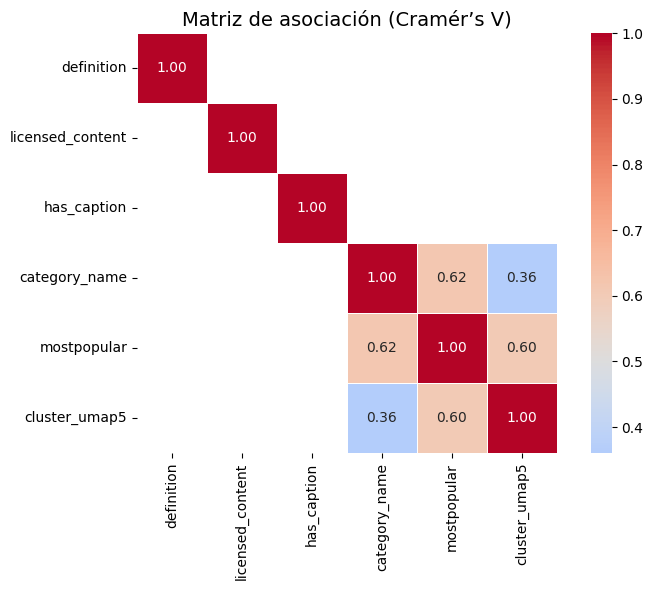

In [45]:

plt.figure(figsize=(8,6))
sns.heatmap(
    cramers_matrix,
    annot=True,         # muestra los valores
    fmt=".2f",          # dos decimales
    cmap="coolwarm",    # paleta de color centrada
    center=0.5,         # valor medio neutro
    square=True,        # hace las celdas cuadradas
    linewidths=0.5,     # separadores
    linecolor="white",
    mask = cramers_matrix < 0.3
)

#sns.heatmap(cramers_matrix, mask=mask, annot=True, fmt=".2f", cmap="Reds", vmin=0, vmax=1)
plt.title("Matriz de asociación (Cramér’s V)", fontsize=14)
plt.tight_layout()
plt.show()


Las conexiones relevantes que estamos obteniendo entre cluster_umap5 con mostpopular de un 0.60 y de un 0.36 con category. Y de category_name con mostpopular de 0.62

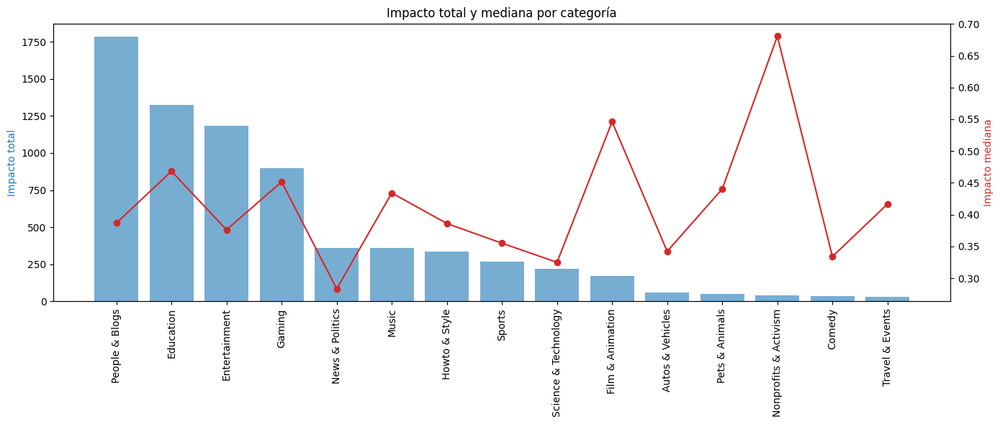

In [46]:
df_1["Impacto"] = df_1["engagement_rate"] * np.log1p(df_1["views"])
impacto_stats = (
    df_1.groupby("category_name")["Impacto"]
        .agg(Impacto_mediana="mean", Impacto_total="sum", n="size")
        .reset_index()
        .sort_values("Impacto_total", ascending=False))

x = np.arange(len(impacto_stats["category_name"]))



fig, ax1 = plt.subplots(figsize=(14,6))

ax1.bar(x, impacto_stats["Impacto_total"], color="tab:blue", alpha=0.6)
ax1.set_ylabel("Impacto total", color="tab:blue")

# Línea roja: impacto medio
ax2 = ax1.twinx()
ax2.plot(x, impacto_stats["Impacto_mediana"], color="tab:red", marker="o")
ax2.set_ylabel("Impacto mediana", color="tab:red")

# 👇 aquí fuerzas las etiquetas con rotación vertical
ax1.set_xticks(x)
ax1.set_xticklabels(impacto_stats["category_name"], rotation=90, ha="center")

plt.title("Impacto total y mediana por categoría")
plt.tight_layout()
plt.show()


Impacto = Engagement efectivo ajustado por visibilidad.
Las Barras azules miden la suma total de impacto por categoría (∑Impacto), mientras que la linea roja muestra la mediana del impacto por categoría. Vemos por tanto categorias con poco impacto total pero mucho impacto de media. Las barras altas nos indican la existencia de categorías que concentran gran parte del impacto global del dataset, ya que suelen tener más vídeos, más vistas o más volumen de interacción acumulada, como es el caso de “People & Blogs”. Destacan la categoría education y gamming con impacto alto total y con una mediana alta, y tambien nonprofit y activism con poco impacto total, no hay muchos videos pero generan gran impacto. 

### Duracion

Si la duración puede ser un valor clave para generar mayor visibilidad, engagement

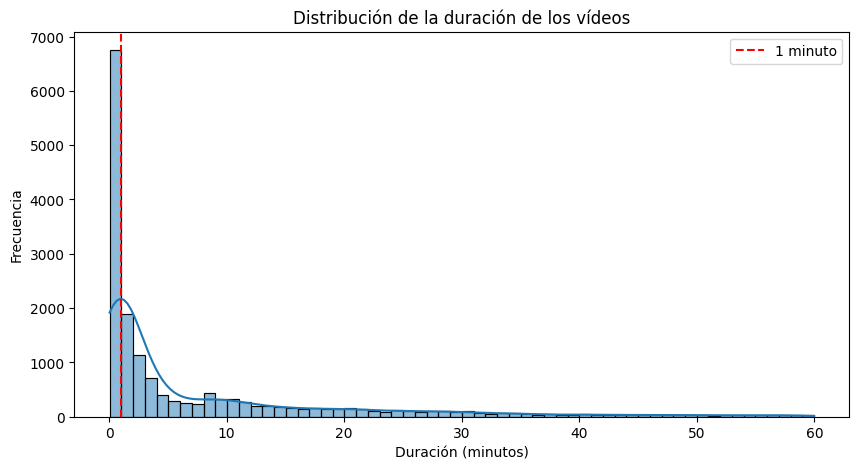

In [47]:
df_dur = df_1[df_1["duration_minutes"] <= 60].copy()
plt.figure(figsize=(10,5))
sns.histplot(df_dur["duration_minutes"], bins=60, kde=True)
plt.axvline(1, color="red", linestyle="--", label="1 minuto")
plt.title("Distribución de la duración de los vídeos")
plt.xlabel("Duración (minutos)")
plt.ylabel("Frecuencia")
plt.legend()
plt.show()

/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/2306620596.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_1, x="duration_bin", order=labels, palette="viridis")


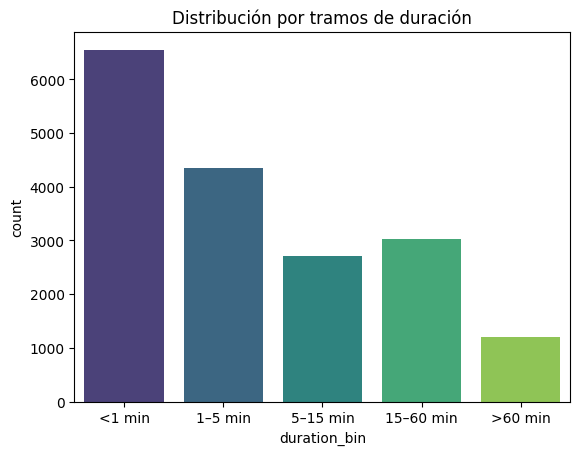

In [48]:
bins = [0, 1, 5, 15, 60, np.inf]
labels = ["<1 min", "1–5 min", "5–15 min", "15–60 min", ">60 min"]
df_1["duration_bin"] = pd.cut(df_1["duration_minutes"], bins=bins, labels=labels)
sns.countplot(data=df_1, x="duration_bin", order=labels, palette="viridis")
plt.title("Distribución por tramos de duración")
plt.show()

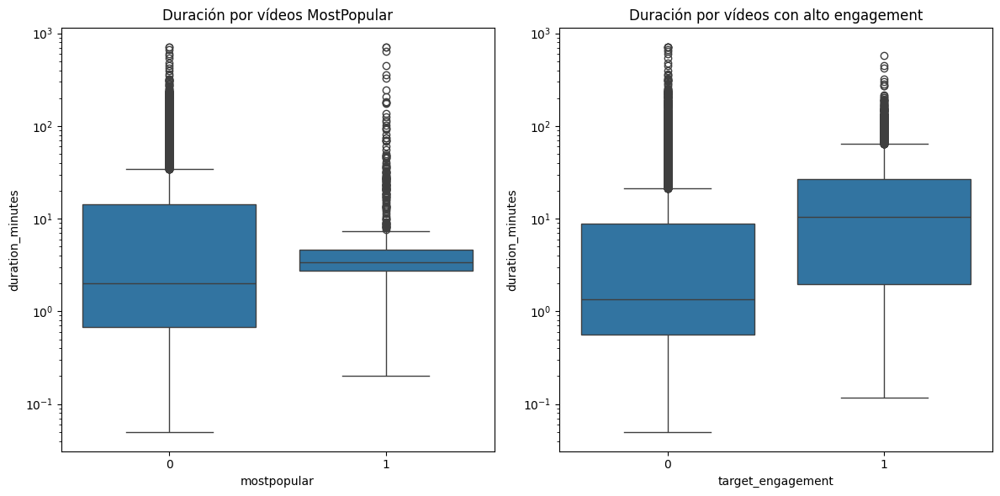

In [49]:
fig, axes = plt.subplots(1,2, figsize=(12,6))
sns.boxplot(data=df_1, x="mostpopular", y="duration_minutes", ax=axes[0])
axes[0].set_title("Duración por vídeos MostPopular")
axes[0].set_yscale("log")

sns.boxplot(data=df_1, x="target_engagement", y="duration_minutes", ax=axes[1])
axes[1].set_title("Duración por vídeos con alto engagement")
axes[1].set_yscale("log")
plt.tight_layout()
plt.show()

In [50]:
from scipy.stats import kruskal
groups = [df_1.loc[df_1["duration_bin"] == cat, "views"] for cat in labels]
stat, p = kruskal(*groups)
print(f"p-valor: {p:.4f}")

p-valor: 0.0000


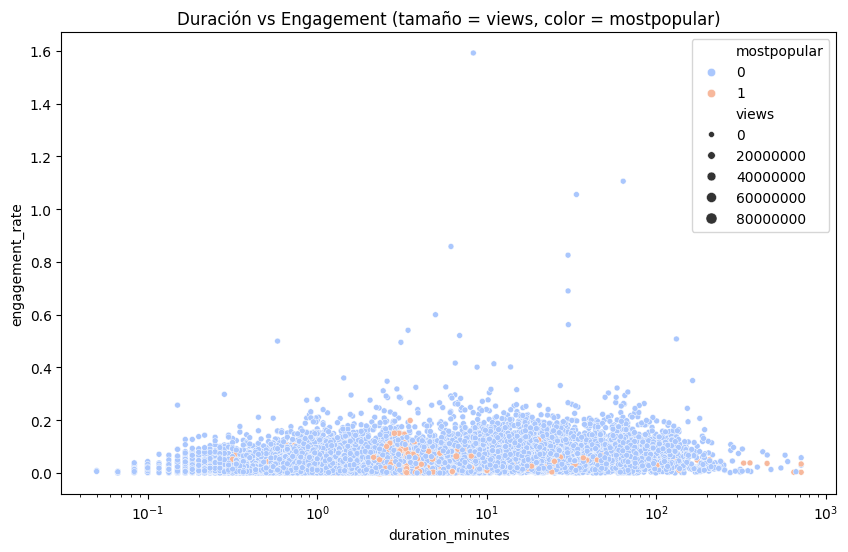

In [51]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df_1, x="duration_minutes", y="engagement_rate",
                size="views", hue="mostpopular", alpha=1, palette="coolwarm")
plt.xscale("log")
plt.title("Duración vs Engagement (tamaño = views, color = mostpopular)")
plt.show()

In [52]:
from scipy.stats import kruskal
groups = [df_1.loc[df_1["duration_bin"] == cat, "views"] for cat in labels]
stat, p = kruskal(*groups)
print(f"p-valor: {p:.4f}")

p-valor: 0.0000


Frecuencia de subida

/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/2220515797.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_1, x="freq_bin", order=labels, palette="viridis")


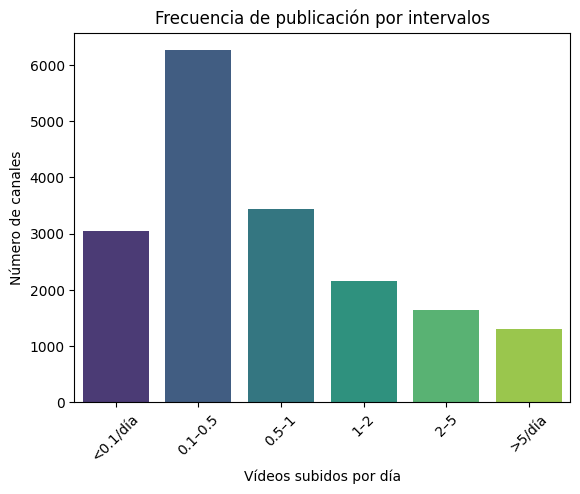

In [53]:
bins = [0, 0.1, 0.5, 1, 2, 5, np.inf]
labels = ["<0.1/día", "0.1–0.5", "0.5–1", "1–2", "2–5", ">5/día"]
df_1["freq_bin"] = pd.cut(df_1["frecuencia_videos"], bins=bins, labels=labels)

sns.countplot(data=df_1, x="freq_bin", order=labels, palette="viridis")
plt.title("Frecuencia de publicación por intervalos")
plt.xlabel("Vídeos subidos por día")
plt.ylabel("Número de canales")
plt.xticks(rotation=45)
plt.show()

In [54]:
corr = df_1["frecuencia_videos"].corr(df_1["views"], method="spearman")
print(f"Correlación frecuencia–views (Spearman): {corr:.3f}")

Correlación frecuencia–views (Spearman): -0.024


In [55]:
for var in ["views", "engagement_rate", "mostpopular"]:
    corr = df_1["frecuencia_videos"].corr(df_1[var], method="spearman")
    print(f"Correlación frecuencia–{var} (Spearman): {corr:.3f}")

Correlación frecuencia–views (Spearman): -0.024
Correlación frecuencia–engagement_rate (Spearman): -0.211
Correlación frecuencia–mostpopular (Spearman): -0.136


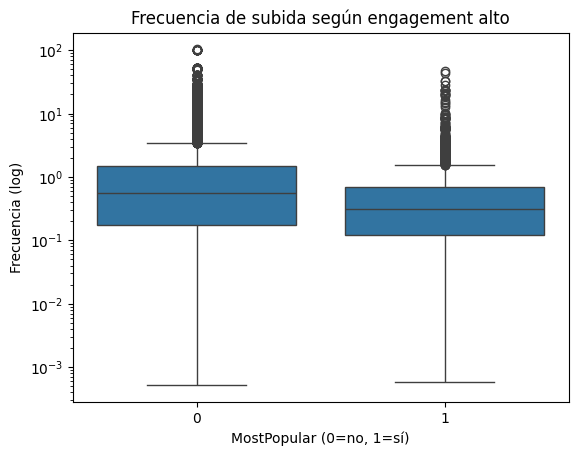

In [56]:
sns.boxplot(data=df_1, x="target_engagement", y="frecuencia_videos")
plt.yscale("log")
plt.title("Frecuencia de subida según engagement alto")
plt.xlabel("MostPopular (0=no, 1=sí)")
plt.ylabel("Frecuencia (log)")
plt.show()

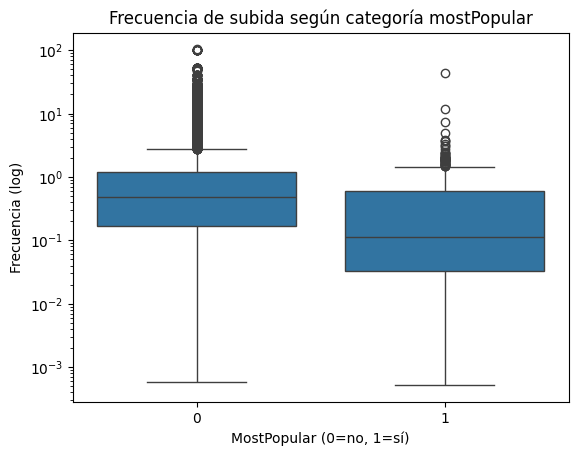

In [57]:
sns.boxplot(data=df_1, x="mostpopular", y="frecuencia_videos")
plt.yscale("log")
plt.title("Frecuencia de subida según categoría mostPopular")
plt.xlabel("MostPopular (0=no, 1=sí)")
plt.ylabel("Frecuencia (log)")
plt.show()

In [58]:
from scipy.stats import mannwhitneyu
u, p = mannwhitneyu(
    df_1.loc[df_1["mostpopular"]==1, "frecuencia_videos"],
    df_1.loc[df_1["mostpopular"]==0, "frecuencia_videos"],
    alternative="two-sided"
)
print(f"p-valor: {p:.4f}")

p-valor: 0.0000


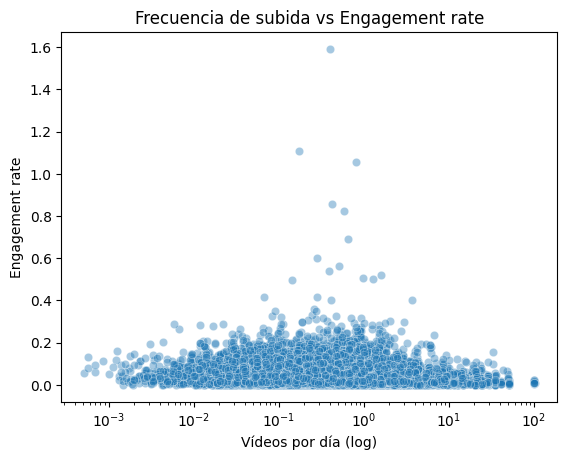

In [59]:
sns.scatterplot(data=df_1, x="frecuencia_videos", y="engagement_rate", alpha=0.4)
plt.xscale("log")
plt.title("Frecuencia de subida vs Engagement rate")
plt.xlabel("Vídeos por día (log)"); plt.ylabel("Engagement rate")
plt.show()

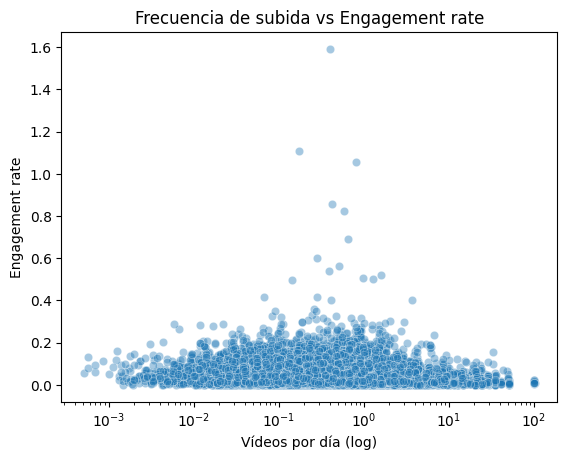

In [60]:
sns.scatterplot(data=df_1, x="frecuencia_videos", y="engagement_rate", alpha=0.4)
plt.xscale("log")
plt.title("Frecuencia de subida vs Engagement rate")
plt.xlabel("Vídeos por día (log)"); plt.ylabel("Engagement rate")
plt.show()

Licencia, subtitulos y definicion

In [61]:
for col in ["has_caption", "licensed_content", "definition"]:
    print(df_1[col].value_counts(normalize=True) * 100)

has_caption
0    97.037868
1     2.962132
Name: proportion, dtype: Float64
licensed_content
1    71.495091
0    28.504909
Name: proportion, dtype: Float64
definition
1    99.225806
0     0.774194
Name: proportion, dtype: float64


/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/2018464229.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df_1[col], ax=ax, palette="viridis", edgecolor="black")
/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/2018464229.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df_1[col], ax=ax, palette="viridis", edgecolor="black")
/var/folders/l5/hswxnhp96655ttqlpbgkrrfw0000gn/T/ipykernel_87928/2018464229.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=df_1[col], ax=ax, palette="viridis", ed

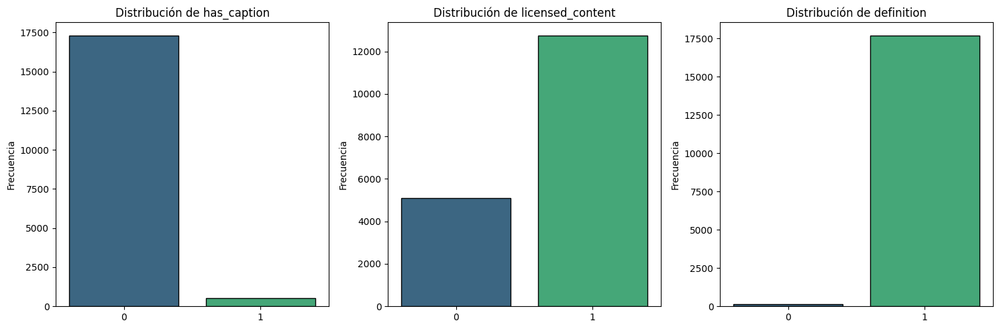

In [62]:
fig, axes = plt.subplots(1, 3, figsize=(15,5))
for ax, col in zip(axes, ["has_caption", "licensed_content", "definition"]):
    sns.countplot(x=df_1[col], ax=ax, palette="viridis", edgecolor="black")
    ax.set_title(f"Distribución de {col}")
    ax.set_xlabel("")
    ax.set_ylabel("Frecuencia")
plt.tight_layout()
plt.show()

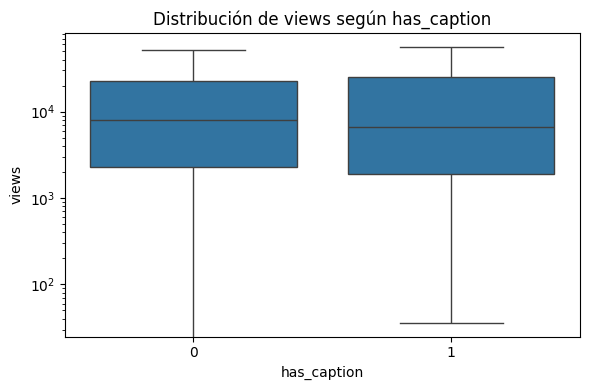

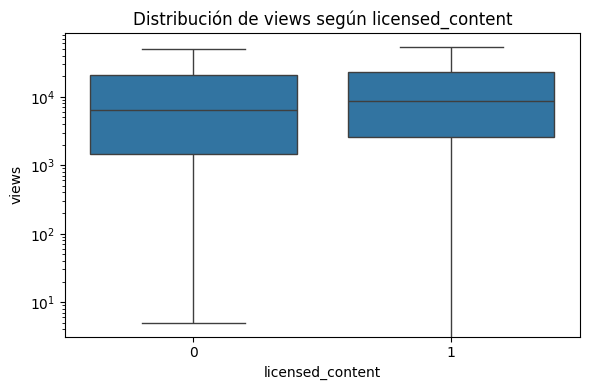

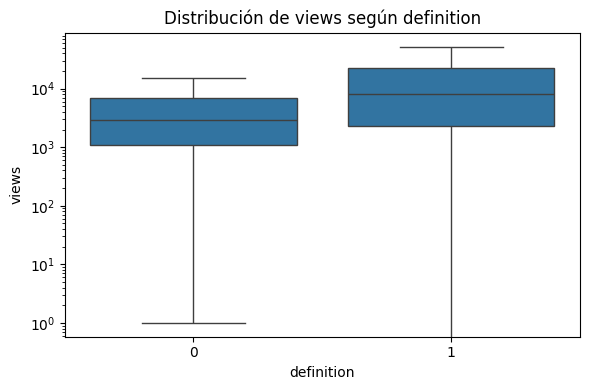

In [63]:
for var in ["has_caption", "licensed_content", "definition"]:
    plt.figure(figsize=(6,4))
    sns.boxplot(data=df_1, x=var, y="views", showfliers=False)
    plt.yscale("log")
    plt.title(f"Distribución de views según {var}")
    plt.tight_layout()
    plt.show()

In [64]:
from scipy.stats import spearmanr
for var in ["has_caption", "licensed_content", "definition"]:
    corr, p = spearmanr(df_1[var], df_1["views"])
    print(f"{var} – views: ρ={corr:.3f}, p={p:.4f}")

has_caption – views: ρ=0.001, p=0.8485
licensed_content – views: ρ=0.076, p=0.0000
definition – views: ρ=0.051, p=0.0000


In [65]:
for var in ["has_caption", "licensed_content", "definition"]:
    corr, p = spearmanr(df_1[var], df_1["mostpopular"])
    print(f"{var} – views: ρ={corr:.3f}, p={p:.4f}")

has_caption – views: ρ=0.104, p=0.0000
licensed_content – views: ρ=0.077, p=0.0000
definition – views: ρ=0.019, p=0.0126


In [66]:
for var in ["has_caption", "licensed_content", "definition"]:
    corr, p = spearmanr(df_1[var], df_1["target_engagement"])
    print(f"{var} – target_engagement: ρ={corr:.3f}, p={p:.4f}")

has_caption – target_engagement: ρ=0.025, p=0.0008
licensed_content – target_engagement: ρ=0.065, p=0.0000
definition – target_engagement: ρ=-0.011, p=0.1392


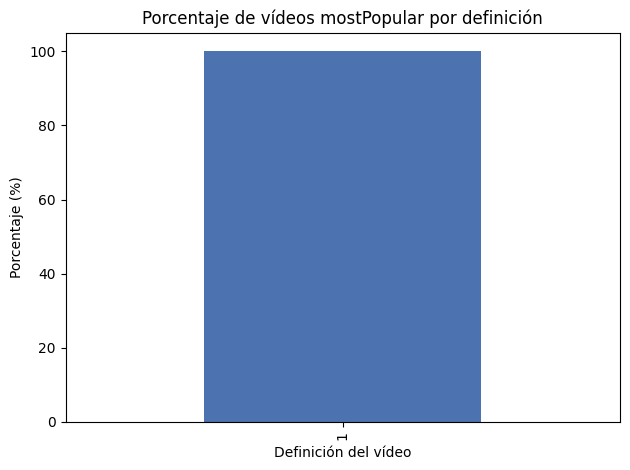

In [67]:
df_pop = df_1[df_1["mostpopular"] == 1]
#df_pop["definition"] = df_pop["definition"].replace({0: "SD (baja definición)", 1: "HD (alta definición)"})
dist = df_pop["definition"].value_counts(normalize=True) * 100
dist.plot(kind="bar", color=["#4C72B0","#55A868"])
plt.title("Porcentaje de vídeos mostPopular por definición")
plt.ylabel("Porcentaje (%)")
plt.xlabel("Definición del vídeo")
plt.tight_layout()
plt.show()


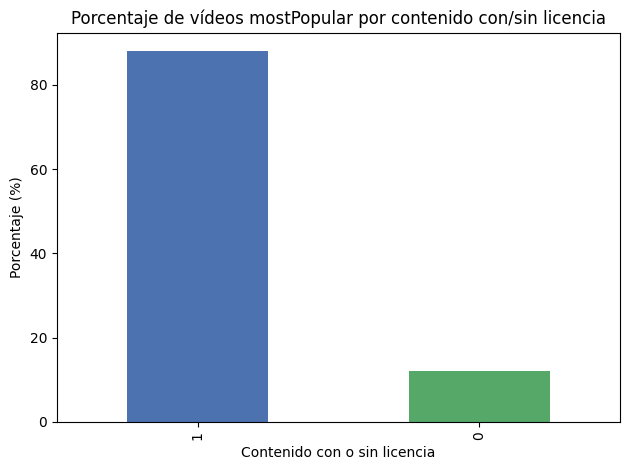

In [68]:
df_pop = df_1[df_1["mostpopular"] == 1]
#df_pop["licensed_content"] = df_pop["licensed_content"].replace({0: "Sin licencia", 1: "Con licencia"})
dist = df_pop["licensed_content"].value_counts(normalize=True) * 100
dist.plot(kind="bar", color=["#4C72B0","#55A868"])
plt.title("Porcentaje de vídeos mostPopular por contenido con/sin licencia")
plt.ylabel("Porcentaje (%)")
plt.xlabel("Contenido con o sin licencia")
plt.tight_layout()
plt.show()

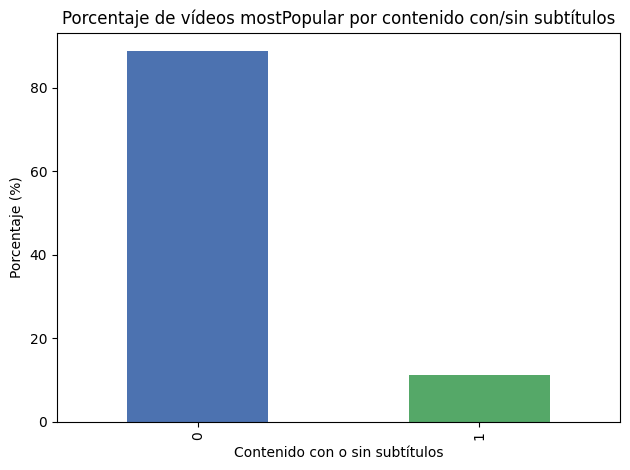

In [69]:
df_pop = df_1[df_1["mostpopular"] == 1]
#df_pop["licensed_content"] = df_pop["licensed_content"].replace({0: "Sin licencia", 1: "Con licencia"})
dist = df_pop["has_caption"].value_counts(normalize=True) * 100
dist.plot(kind="bar", color=["#4C72B0","#55A868"])
plt.title("Porcentaje de vídeos mostPopular por contenido con/sin subtítulos")
plt.ylabel("Porcentaje (%)")
plt.xlabel("Contenido con o sin subtítulos")
plt.tight_layout()
plt.show()

In [70]:
df_1["licensed_content"].value_counts(True)

licensed_content
1    0.714951
0    0.285049
Name: proportion, dtype: Float64

In [71]:
df_1["definition"].value_counts(True)

definition
1    0.992258
0    0.007742
Name: proportion, dtype: float64

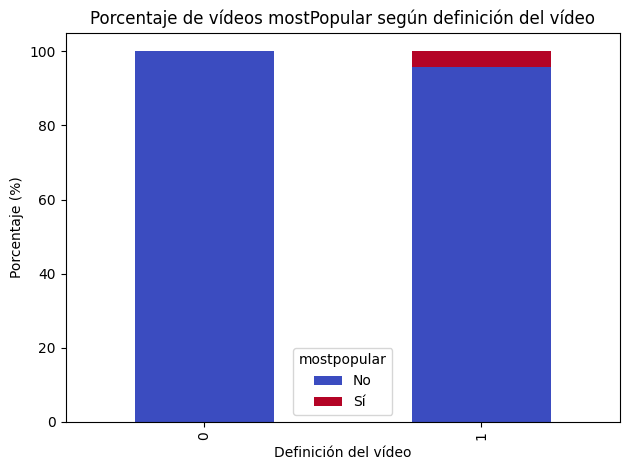

In [72]:
c=pd.crosstab(df_1["definition"], df_1["mostpopular"], normalize='index') * 100

c.plot(kind="bar", stacked=True, colormap="coolwarm")

plt.title("Porcentaje de vídeos mostPopular según definición del vídeo")
#plt.title("Porcentaje de vídeos mostPopular según definición del vídeo")
plt.xlabel("Definición del vídeo")
plt.ylabel("Porcentaje (%)")
plt.legend(title="mostpopular", labels=["No", "Sí"])
plt.tight_layout()
plt.show()

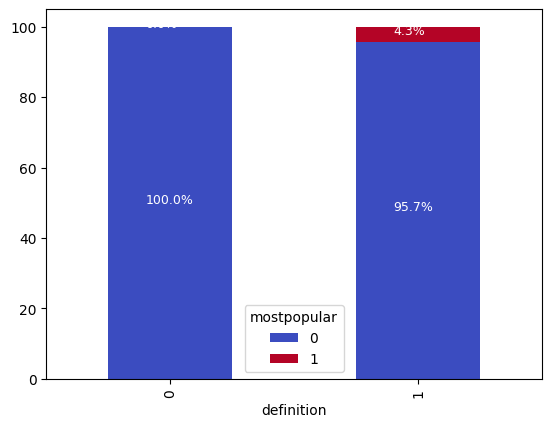

In [73]:
c.plot(kind="bar", stacked=True, colormap="coolwarm")
for idx, row in enumerate(c.values):
    plt.text(idx - 0.1, row[0]/2, f"{row[0]:.1f}%", color="white", fontsize=9)
    plt.text(idx - 0.1, 100 - row[1]/2, f"{row[1]:.1f}%", color="white", fontsize=9)
plt.show()

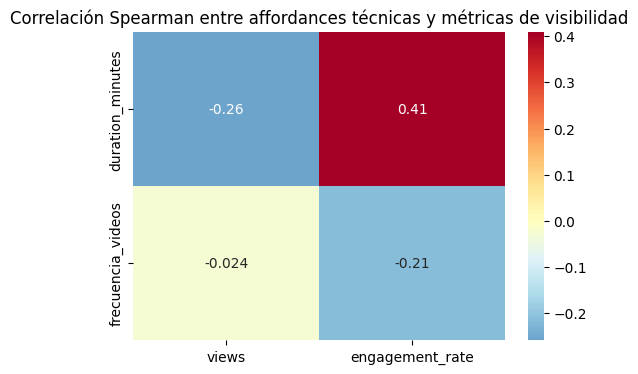

In [74]:
aff_tech = ["duration_minutes", "frecuencia_videos"]
targets = ["views", "engagement_rate"]
corrs = df_1[aff_tech + targets].corr(method="spearman").loc[aff_tech, targets]

plt.figure(figsize=(6,4))
sns.heatmap(corrs, annot=True, cmap="RdYlBu_r", center=0)
plt.title("Correlación Spearman entre affordances técnicas y métricas de visibilidad")
plt.show()